<a href="https://colab.research.google.com/github/leticiasdrummond/Notebooks_IT306/blob/main/17_ParteI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center>
Carlos Alberto Medon Dias Ferraz

Carlos Eduardo Bento Honorio

Letícia Sampaio Drummond Valladares  
</center>
    

---

<center>

## **PROJETO I - MODELO DRUMMOND**

# **Parte 1 - Avaliação do Recurso Solar – Comparação dos 3 anos escolhidos de dados**

<center>


---



Professores:

   Dr. João Lucas, Dr. Gustavo Fraidenraich e Dr. Tárcio Barros
   
Monitoria:

   Me. João Frederico

<center>
31 de Novembro de 2025
<center>

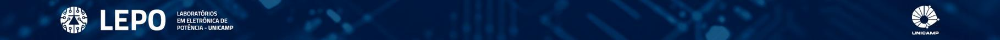

# **Introdução**

Este Notebook integra a primeira parte do Trabalho Final da diciplina IT306 - Photovoltaic Systems, at FEEC-Unicamp, ministrada pelos Professores Dr. João Lucas, Dr. Gustavo, and Dr. Tárcio e serve como guia para verificacao da execucao dos códigos correspondentes a modelagem de uma usina fotovoltaica (FV) utilizando a linguagem Python e a biblioteca PVlib. O objetivo principal é implementar uma cadeia completa de modelos físicos para simular a geração de energia FV, validando os resultados por meio de comparação com as simulações de referência realizadas no PVsyst.

A configuração da usina é padrão, instalação em solo, considerando um inversor com potência igual ou superior a 75 kW e um conjunto de módulos FV (monofaciais orientados para o sul), cuja potência total seja superior à do inversor. Não são consideradas as perdas por self-shading (sombreamento entre as strings).

A proposta contempla a análise de dados meteorológicos de diferentes anos, a aplicação de modelos físicos e matemáticos para estimativa da irradiância no plano dos módulos.

Através do presente arquivo do notebook (.ipynb), apresentamos os códigos comentados, com descrições e títulos de seção antes de cada bloco de código.

Acesse também pelo GitHub a versao de 29 de Out. de 2025:

> Este e outros notebooks desenvolvidos ou estudados no ambido desta disciplina podem ser acessados no github por: https://github.com/leticiasdrummond/Notebooks_IT306


---
# **Metodologia**


**Introdução à Avaliação do Recurso Solar (Item 1 do Projeto)**

O presente segmento do projeto de modelagem de usina fotovoltaica (FV), conforme delineado no escopo (Item 1: Avaliação do Recurso Solar), concentra-se na definição e validação do *database* meteorológico a ser empregado, o qual servirá como insumo fundamental para toda a cadeia de modelos físicos de geração.

### Objetivo da Etapa

O objetivo principal desta fase é selecionar, com precisão e fundamentação teórica, o conjunto de dados meteorológicos mais representativo para a localização específica da usina, minimizando os desvios inerentes a fontes de dados satelitais. Serão utilizados dados de três anos distintos no período de 2019 a 2021 para garantir uma amostra temporal robusta.

*   **Configuração Padrão**: Usina em solo, módulos monofaciais, orientação Sul (sem *self-shading*).
*  Inversor ≥75 kW e potência de módulo superior à do inversor.
*   Local: SOLRMAP University of Arizona (OASIS)
    
    - Latitude: 32.22969
    - Longitude: 110.95534
    - Elevação: 786 AMSL
    - Time Zone: MSTI


### Metodologia de Validação Paramétrica

A metodologia adotada envolve a comparação rigorosa das séries temporais horárias de Irradiância Global Horizontal (GHI), Irradiância Direta Normal (DNI) e Irradiância Difusa Horizontal (DHI). Serão avaliadas as fontes de satélite NSRDB (PSMv4) e PVGIS (SARAH3).

A validação paramétrica será realizada contra dados de referência de uma Estação Solarimétrica, utilizando as ferramentas de leitura do `pvlib.iotools`. A escolha do *dataset* (NSRDB ou PVGIS) será determinada pela minimização das seguintes métricas de erro estatístico, aplicadas em escala horária ao longo do ano de análise:

1.  **RMSE (Root Mean Square Error)**
2.  **MAE (Mean Absolute Error)**
3.  **MBE (Mean Bias Error)**

A seleção do *database* com menor erro é crítica, pois a propagação de erros nos dados de irradiância afeta diretamente a predição da geração mensal e anual, comprometendo as metas de precisão estabelecidas para este projeto (simulações mensais dentro de $\pm 30\%$ e anuais dentro de $\pm 10\%$ da geração de referência).

### Análise de Caracterização do Recurso Solar

Uma vez selecionado o *database* meteorológico validado, serão gerados gráficos analíticos essenciais para a caracterização física do recurso solar e para a definição dos modelos de decomposição e transposição:

*   **Fração Difusa vs. Índice de Clareza $\boldsymbol{K_{t}}$:** Plotagem da Fração Difusa $(DHI/GHI)$ em função do Índice de Clareza $K_{t}$ $(GHI/(H_{0} \cdot \cos(\theta_{z})))$. Esta análise é fundamental para subsidiar a escolha dos modelos de decomposição de irradiância, como Erbs ou DIRINT, que se baseiam em $K_{t}$.
*   **Componentes do Recurso Solar na Horizontal vs. Ângulo Zenital:** Análise da variação horária das componentes GHI, DNI e DHI em função do ângulo zenital $(\theta_{z})$ para períodos horários.
*   **Inspeção Visual Bidimensional:** Visualização da distribuição dos dados horários de GHI, DNI e DHI para identificação de padrões climáticos e anomalias.

Esta primeira etapa garante a definição dos parâmetros meteorológicos iniciais com a precisão exigida, fornecendo a base para a próxima fase de modelagem fotovoltaica.








### **Referencias Utilizadas**
- https://assessingsolar.org/notebooks/quality_asessment.html#
- DMxxxM10RT-B60HBT/HST 490~510W

- Best Practices Handbook for the Collection and Use of Solar Resource Data for Solar Energy Applications: Fourth Edition (2024)
- Manual de Engenharia para Sistemas Fotovoltaicos (2014).

## **Instalação de bibliotecas**

In [59]:
# @title
# @title
!pip install pvlib

In [60]:
# @title
# @title
!pip install folium

## **Ferramentas do PVLib**


In [61]:
# @title
# @title
# Importação das bibliotecas necessárias
import pvlib # Biblioteca para modelagem de energia solar fotovoltaica (FV)
from pvlib import location  # Módulo para definir localização geográfica
from pvlib import pvsystem
from pvlib import tools
from pvlib.pvsystem import retrieve_sam
import folium
import pandas as pd # Manipulação de dados em formato de tabela
import matplotlib.pyplot as plt # Plotagem de gráficos
from sklearn.metrics import r2_score
from scipy.constants import Boltzmann, elementary_charge
import numpy as np
from pvlib import irradiance
from pvlib.iam import physical

In [62]:
# @title
# @title
'''from google.colab import drive
drive.mount('/content/drive')'''

"from google.colab import drive\ndrive.mount('/content/drive')"

# **1. Avaliação do Recurso Solar**
Para efeito de avaliação da qualidade do recurso solar, na regiao do Arizona (localidade da estação solarimétrica indicada para o projeto) e definição do Database metereológico a ser aplicado na modelagem fotovoltaica, foram escolhidos os dados de GHI, DHI, DNI disponíveis nas bases de dados de satélite da NSRDB e do PVGIS e da estação solarimétrica UAT - OASIS/Arizona, para os anos de 2019, 2020 e 2021.
As medições, originalmente fornecidas em bases horária ou em minuto, foram adequadas para séries diárias para possibilitar a comparação entre elas.

## **1.1 Localização de Referência da Usina Fotovoltaica**
Para este trabalho, foi considerada a seguinte localização geográfica:

| **Parâmetro**       | **Valor**               | **Descrição**                          |
|----------------------|-------------------------|----------------------------------------|
| **Nome da Estação**    | UAT	SOLRMAP University of Arizona (OASIS)	        | Estação operada pelo NREL  Measurement and Instrumentation Data Center (MIDC)            |
| **Latitude**         |32.22969            | Coordenada geográfica                  |
| **Longitude**        | -110.95534            | Coordenada geográfica                  |
| **Altitude**         | 786 metros             | Elevação em relação ao nível do mar    |
| ***Time Zone***         | MST             | *Mountain Standard Time (MST) is 7 hours behind Coordinated Universal Time (UTC). This time zone is in use during standard time in: North America. *|

FONTE:
Andreas, A.; Wilcox, S.; (2010). Observed Atmospheric and Solar Information
System (OASIS); Tucson, Arizona (2025); NREL Report No. DA-5500-56494.
http://dx.doi.org/10.5439/1052226


*   **Mapa de Referência**




In [63]:
# @title
# @title
## Mapa de Referência
# Coordenadas geográficas (latitude, longitude, altitude) de UAT
latitude = 32.22969
longitude = -110.95534
altitude = 786  # em metros


# Criar um mapa interativo centralizado na localização
mapa = folium.Map(
    location=[latitude, longitude],
    zoom_start=12,
    tiles='OpenStreetMap'  # Tipo de mapa
)

# Adicionar um marcador no mapa
folium.Marker(
    [latitude, longitude],
    popup="Localização selecionada: SOLRMAP University of Arizona (OASIS) (UAT)",
    icon=folium.Icon(color='green', icon='info-sign')
).add_to(mapa)

# Exibir o mapa
mapa

## **1.2 Características Relevantes da Região de Tucson**


    - Alta disponibilidade solar, com valor médio superior a 300 dias de sol/ano;
    - Região é um dos melhores locais dos EUA para geração FV;
    - Temperaturas elevadas no verão, com a atenção para a modelagem térmica na determinação das perdas;
    - Baixa nebulosidade, ideal para uso de modelos de céu claro (Haurwitz, Ineichen);
    - Clima desértico quente e seco, com ventos leves e poucas chuvas, cenário ideal para simulações de alto desempenho FV, mas requer controle de poeira.

## **1.3 Funcao da Posição Solar**

> Permite localizar a posição do sol em relação ao módulo na localidade do projeto.



In [64]:
# @title
# @title
Latitude = 32.22969
Longitude = -110.95534
Altitude = 786
tz= 'Etc/GMT-7'



---



## **1.4 Parâmetros Climáticos Iniciais para a Modelagem**
Para o início da modelagem foram utilizadas as seguintes variáveis metereológicas:

**Irradiação Solar**
   - GHI (Irradiância Global Horizontal) [W/m²]
   - DNI (Irradiância Direta Normal) [W/m²]
   - DHI (Irradiância Difusa Horizontal) [W/m²]

**Variáveis Ambientais**
   - Temperatura do Ar [°C]
   - Velocidade do Vento [m/s]

Para os anos 2019, 2020 e 2021, essas variáveis meteorológicas, em séries horárias (1h), foram extraidas nas bases de dados da NSRDB (NSRDB PSMv4), PVGIS (PVGIS 5.3 ERA 5) e dados medidos in loco da University of Arizona (OASIS)	Estaçao "UAT" operada pelo NREL Measurement and Instrumentation Data Center (MIDC):



## **1.5 Definicao do Database Metereológico**
A definição do Database metereológico a ser utilizado na modelagem da usina FV, foi baseada nos dados de GHI do perído de 2019 a 2021, extraídos dos dois satélites, os quais foram comparados com os dados medidos pela estação UAT, no mesmo período. A escolha do Databse metereológico, ou do satélite foi baseada em análises estatística dos parâmetros RMSE, MAE e R2.

### **1.5.1 NSRDB**

Os códigos a seguir consistem na importação dos dados horários para os anos de 2019, 2020 e 2021. Após a essa importação, os valores com discretização horária foram reajustados para escala diária.

In [65]:
# @title
# @title
latitude = 32.22969   # Tucson, Arizona, EUA
longitude = -110.95534  # Tucson, Arizona, EUA
email = 'l298985@dac.unicamp.br'
api_key = 'UdBqiBH0jDG1heMhlE7sDhZSnJiDETFaPefAH7m4'
year_2019 = 2019
year_2020 = 2020
year_2021 = 2021

data_nsrdb_2019, meta_nsrdb = pvlib.iotools.get_nsrdb_psm4_full_disc(latitude,longitude, api_key, email, year_2019, time_step=60, parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'), leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=60) #utc=Falce para evitar erroos no fuso horário!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!


data_nsrdb_2020, meta_nsrdb = pvlib.iotools.get_nsrdb_psm4_full_disc(latitude,longitude, api_key, email, year_2020, time_step=60, parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'), leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=60)


data_nsrdb_2021, meta_nsrdb = pvlib.iotools.get_nsrdb_psm4_full_disc(latitude,longitude, api_key, email, year_2021, time_step=60, parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'), leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=60)

print(data_nsrdb_2019)
print(data_nsrdb_2020)
print(data_nsrdb_2021)

                           Year  Month  Day  Hour  Minute  temp_air  temp_dew  \
2019-01-01 00:00:00-07:00  2019      1    1     0       0      4.00      2.00   
2019-01-01 01:00:00-07:00  2019      1    1     1       0      3.50      1.60   
2019-01-01 02:00:00-07:00  2019      1    1     2       0      3.10      1.20   
2019-01-01 03:00:00-07:00  2019      1    1     3       0      2.70      0.70   
2019-01-01 04:00:00-07:00  2019      1    1     4       0      2.20      0.30   
...                         ...    ...  ...   ...     ...       ...       ...   
2019-12-31 19:00:00-07:00  2019     12   31    19       0      8.00      5.70   
2019-12-31 20:00:00-07:00  2019     12   31    20       0      7.00      5.00   
2019-12-31 21:00:00-07:00  2019     12   31    21       0      6.10      4.10   
2019-12-31 22:00:00-07:00  2019     12   31    22       0      5.20      3.30   
2019-12-31 23:00:00-07:00  2019     12   31    23       0      4.50      2.50   

                           

In [66]:
# @title
# @title
print(data_nsrdb_2019['ghi'].resample('D').sum())
print(data_nsrdb_2020['ghi'].resample('D').sum())
print(data_nsrdb_2021['ghi'].resample('D').sum())

2019-01-01 00:00:00-07:00   3708.00
2019-01-02 00:00:00-07:00   2985.00
2019-01-03 00:00:00-07:00   3931.00
2019-01-04 00:00:00-07:00   3973.00
2019-01-05 00:00:00-07:00   2731.00
                              ...  
2019-12-27 00:00:00-07:00   2145.00
2019-12-28 00:00:00-07:00   2055.00
2019-12-29 00:00:00-07:00   3803.00
2019-12-30 00:00:00-07:00   2288.00
2019-12-31 00:00:00-07:00   3296.00
Freq: D, Name: ghi, Length: 365, dtype: float64
2020-01-01 00:00:00-07:00   3740.00
2020-01-02 00:00:00-07:00   3838.00
2020-01-03 00:00:00-07:00   3719.00
2020-01-04 00:00:00-07:00   3853.00
2020-01-05 00:00:00-07:00   3990.00
                              ...  
2020-12-27 00:00:00-07:00   3321.00
2020-12-28 00:00:00-07:00   3025.00
2020-12-29 00:00:00-07:00   3694.00
2020-12-30 00:00:00-07:00   3911.00
2020-12-31 00:00:00-07:00   3306.00
Freq: D, Name: ghi, Length: 366, dtype: float64
2021-01-01 00:00:00-07:00   3816.00
2021-01-02 00:00:00-07:00   3722.00
2021-01-03 00:00:00-07:00   3762.00
2021

### **1.5.2 PVGIS**
Os códigos a seguir foram importados do PVGIS. Vale esclarecer que "POA Global" é equivalente ao GHI quando tratamos da incidência sobre a superfície com inclinacao nula.







**2019**

In [67]:
# @title
# @title
import pvlib
from pvlib.iotools import get_pvgis_hourly
import pandas as pd

# Dados fornecidos
latitude = 32.22969
longitude = -110.95534
altitude = 786
tz = 'Etc/GMT-7'

# Obter dados horários do PVGIS usando ERA5
try:
    data = get_pvgis_hourly(
        latitude=latitude,
        longitude=longitude,
        start=2019,  # inicia em jan.
        end=2019,    # termina em dez.
        raddatabase='PVGIS-ERA5',  # Base de dados ERA5
        components=False,     # Retorna componentes de radiação
        surface_tilt=0,      # Superfície horizontal
        surface_azimuth=0,   # Orientação para sul
        outputformat='json',
        usehorizon=True,     # Considera horizonte
        userhorizon=None,    # Sem horizonte personalizado
        pvcalculation=False, # Apenas dados meteorológicos
        timeout=60
    )

    # Extrair os dados
    df = data[0]  # DataFrame com os dados horários
    metadata = data[1]  # Metadados

    print("Dados obtidos com sucesso!")
    print(f"Localização: {latitude}, {longitude}")
    print(f"Altitude: {altitude} m")
    print(f"Fuso horário: {tz}")
    print(f"Período dos dados: {df.index[0]} até {df.index[-1]}")
    print("\nPrimeiras linhas dos dados:")
    print(df.head())

    print("\nColunas disponíveis:")
    for col in df.columns:
        print(f"- {col}")

    print("\nMetadados:")
    for key, value in metadata.items():
        print(f"{key}: {value}")

except Exception as e:
    print(f"Erro ao obter dados: {e}")

Dados obtidos com sucesso!
Localização: 32.22969, -110.95534
Altitude: 786 m
Fuso horário: Etc/GMT-7
Período dos dados: 2019-01-01 00:30:00+00:00 até 2019-12-31 23:30:00+00:00

Primeiras linhas dos dados:
                           poa_global  solar_elevation  temp_air  wind_speed  \
time                                                                           
2019-01-01 00:30:00+00:00        0.00            -0.92     10.95        5.31   
2019-01-01 01:30:00+00:00        0.00             0.00     10.09        4.90   
2019-01-01 02:30:00+00:00        0.00             0.00      9.42        4.62   
2019-01-01 03:30:00+00:00        0.00             0.00      8.98        4.69   
2019-01-01 04:30:00+00:00        0.00             0.00      8.51        4.83   

                           Int  
time                            
2019-01-01 00:30:00+00:00    0  
2019-01-01 01:30:00+00:00    0  
2019-01-01 02:30:00+00:00    0  
2019-01-01 03:30:00+00:00    0  
2019-01-01 04:30:00+00:00    0  

Co

**2020**

In [68]:
# @title
# @title
import pvlib
from pvlib.iotools import get_pvgis_hourly
import pandas as pd

# Dados fornecidos
latitude = 32.22969
longitude = -110.95534
altitude = 786
tz = 'Etc/GMT-7'

# Obter dados horários do PVGIS usando ERA5
try:
    data_20 = get_pvgis_hourly(
        latitude=latitude,
        longitude=longitude,
        start=2020,  # Usará data padrão se None
        end=2020,    # Usará data padrão se None
        raddatabase='PVGIS-ERA5',  # Base de dados ERA5
        components=False,     # Retorna componentes de radiação
        surface_tilt=0,      # Superfície horizontal
        surface_azimuth=0,   # Orientação para sul
        outputformat='json',
        usehorizon=True,     # Considera horizonte
        userhorizon=None,    # Sem horizonte personalizado
        pvcalculation=False, # Apenas dados meteorológicos
        timeout=60
    )

    # Extrair os dados
    df_2020 = data_20[0]  # DataFrame com os dados horários
    metadata = data_20[1]  # Metadados

    # Rename the 'poa_global' column to 'poa_global_2020'
    df_2020 = df_2020.rename(columns={'poa_global': 'poa_global_2020'})

    print("Dados obtidos com sucesso!")
    print(f"Localização: {latitude}, {longitude}")
    print(f"Altitude: {altitude} m")
    print(f"Fuso horário: {tz}")
    print(f"Período dos dados: {df_2020.index[0]} até {df_2020.index[-1]}")
    print("\nPrimeiras linhas dos dados:")
    display(df_2020.head())

    print("\nColunas disponíveis:")
    for col in df_2020.columns:
        print(f"- {col}")

    print("\nMetadados:")
    for key, value in metadata.items():
        print(f"{key}: {value}")

except Exception as e:
    print(f"Erro ao obter dados: {e}")

Dados obtidos com sucesso!
Localização: 32.22969, -110.95534
Altitude: 786 m
Fuso horário: Etc/GMT-7
Período dos dados: 2020-01-01 00:30:00+00:00 até 2020-12-31 23:30:00+00:00

Primeiras linhas dos dados:


,poa_global_2020,solar_elevation,temp_air,wind_speed,Int
time,,,,,
2020-01-01 00:30:00+00:00,0.00,-0.92,13.73,1.72,0
2020-01-01 01:30:00+00:00,0.00,0.00,11.59,1.24,0
2020-01-01 02:30:00+00:00,0.00,0.00,11.71,0.28,0
2020-01-01 03:30:00+00:00,0.00,0.00,10.85,0.69,0
2020-01-01 04:30:00+00:00,0.00,0.00,10.05,1.03,0



Colunas disponíveis:
- poa_global_2020
- solar_elevation
- temp_air
- wind_speed
- Int

Metadados:
inputs: {'location': {'latitude': 32.22969, 'longitude': -110.95534, 'elevation': 752.0}, 'meteo_data': {'radiation_db': 'PVGIS-ERA5', 'meteo_db': 'ERA5', 'year_min': 2020, 'year_max': 2020, 'use_horizon': True, 'horizon_db': None, 'horizon_data': 'DEM-calculated'}, 'mounting_system': {'fixed': {'slope': {'value': 0, 'optimal': False}, 'azimuth': {'value': -179, 'optimal': False}, 'type': 'free-standing'}}, 'pv_module': {'technology': None, 'peak_power': None, 'system_loss': None}, 'descriptions': {'location': {'description': 'Selected location', 'variables': {'latitude': {'description': 'Latitude', 'units': 'decimal degree'}, 'longitude': {'description': 'Longitude', 'units': 'decimal degree'}, 'elevation': {'description': 'Elevation', 'units': 'm'}}}, 'meteo_data': {'description': 'Sources of meteorological data', 'variables': {'radiation_db': {'description': 'Solar radiation database'

**2021**

In [69]:
# @title
# @title
import pvlib
from pvlib.iotools import get_pvgis_hourly
import pandas as pd

# Dados fornecidos
latitude = 32.22969
longitude = -110.95534
altitude = 786
tz = 'Etc/GMT-7'

# Obter dados horários do PVGIS usando ERA5
try:
    data = get_pvgis_hourly(
        latitude=latitude,
        longitude=longitude,
        start=2021,  # Usará data padrão se None
        end=2021,    # Usará data padrão se None
        raddatabase='PVGIS-ERA5',  # Base de dados ERA5
        components=False,     # Retorna componentes de radiação
        surface_tilt=0,      # Superfície horizontal
        surface_azimuth=0,   # Orientação para sul
        outputformat='json',
        usehorizon=True,     # Considera horizonte
        userhorizon=None,    # Sem horizonte personalizado
        pvcalculation=False, # Apenas dados meteorológicos
        timeout=60
    )

    # Extrair os dados
    df_2021 = data[0]  # DataFrame com os dados horários
    metadata = data[1]  # Metadados

    # Rename the 'poa_global' column to 'poa_global_2021'
    df_2021 = df_2021.rename(columns={'poa_global': 'poa_global_2021'})

    print("Dados obtidos com sucesso!")
    print(f"Localização: {latitude}, {longitude}")
    print(f"Altitude: {altitude} m")
    print(f"Fuso horário: {tz}")
    print(f"Período dos dados: {df_2021.index[0]} até {df_2021.index[-1]}")
    print("\nPrimeiras linhas dos dados:")
    print(df_2021.head())

    print("\nColunas disponíveis:")
    for col in df_2021.columns:
        print(f"- {col}")

    print("\nMetadados:")
    for key, value in metadata.items():
        print(f"{key}: {value}")

except Exception as e:
    print(f"Erro ao obter dados: {e}")

Dados obtidos com sucesso!
Localização: 32.22969, -110.95534
Altitude: 786 m
Fuso horário: Etc/GMT-7
Período dos dados: 2021-01-01 00:30:00+00:00 até 2021-12-31 23:30:00+00:00

Primeiras linhas dos dados:
                           poa_global_2021  solar_elevation  temp_air  \
time                                                                    
2021-01-01 00:30:00+00:00             0.00            -0.92     14.15   
2021-01-01 01:30:00+00:00             0.00             0.00     13.01   
2021-01-01 02:30:00+00:00             0.00             0.00     11.78   
2021-01-01 03:30:00+00:00             0.00             0.00     10.30   
2021-01-01 04:30:00+00:00             0.00             0.00     10.66   

                           wind_speed  Int  
time                                        
2021-01-01 00:30:00+00:00        2.41    0  
2021-01-01 01:30:00+00:00        2.62    0  
2021-01-01 02:30:00+00:00        2.48    0  
2021-01-01 03:30:00+00:00        1.66    0  
2021-01-01 04

### **1.5.3 Dados de Estação UAT-OASIS**

Os dados medidos na estação são fundamentais para garantir uma escolha correta do satélite a ser utilizado na modelagem da usina FV.

**2019**

* **Medições Locais UAT**

In [70]:
# @title
# @title
#Importando os Dados da Estação Solarimátrica
#Localização da Universidade de Arizona (OASIS)

df_weather = pvlib.iotools.read_midc_raw_data_from_nrel('UAT',               # Station id
                                                    pd.Timestamp('20190101'),   # Start date jan 2019
                                                    pd.Timestamp('20191231'))   # End date dez 2019

# Rename columns to match expected names (Renomeia as colunas pela combinação esperada para melhor organização)
df_weather = df_weather.rename(columns={
    'Air Temperature [deg C]': 'temp_air',
    'Avg Wind Speed @ 3m [m/s]': 'wind_speed',
    'Diffuse Horiz [W/m^2]': 'dhi',
    'Direct Normal [W/m^2]': 'dni',
    'Global Horiz (platform) [W/m^2]': 'ghi'
})


df_weather.head(3)

,Unnamed: 0,Year,DOY,MST,dni,dhi,Global Horiz (tracker) [W/m^2],ghi,Temp CHP1 [deg C],Temp CM22 (tracker) [deg C],...,CR1000 Temp [deg C],CR1000 Battery [VDC],temp_air,Rel Humidity [%],Station Pressure [mBar],wind_speed,Avg Wind Direction @ 3m [deg from N],Peak Wind Speed @ 3m [m/s],Zenith Angle [degrees],Azimuth Angle [degrees]
2019-01-01 00:00:00-07:00,0,2019,1,0,-0.43,0.00,-1.04,-1.37,-246.80,-246.80,...,7.49,13.53,3.89,87.90,923.39,5.60,115.00,6.95,NaN,NaN
2019-01-01 00:01:00-07:00,0,2019,1,1,-0.29,0.00,-1.11,-1.37,-246.80,-246.80,...,7.49,13.53,3.85,87.90,923.40,6.17,113.90,7.70,NaN,NaN
2019-01-01 00:02:00-07:00,0,2019,1,2,-0.39,0.00,-1.11,-1.37,-246.80,-246.80,...,7.49,13.53,3.84,87.90,923.40,6.91,117.50,8.45,NaN,NaN


* **Mudanca da escala temporal**








In [71]:
# @title
# @title
df_weather_ghi_horario_2019 = df_weather['ghi'].resample("H").mean()

/tmp/ipython-input-1204343343.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_weather_ghi_horario_2019 = df_weather['ghi'].resample("H").mean()


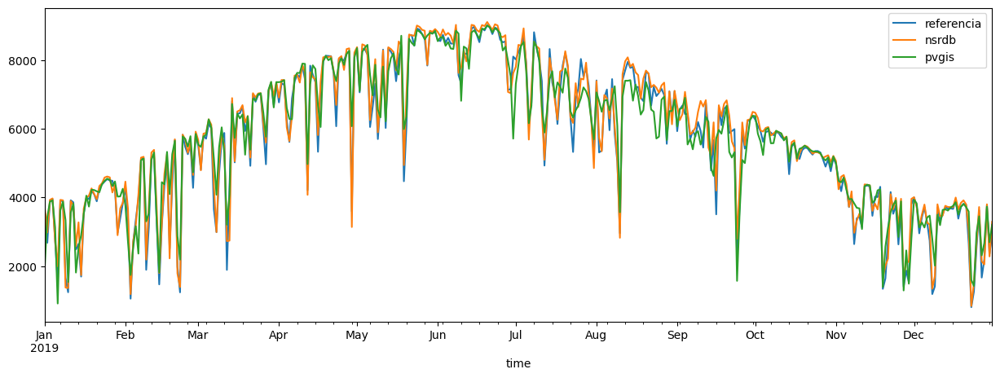

In [72]:
# @title
# @title
df_weather_ghi_horario_2019.resample("D").sum().plot(label ='referencia', figsize=(15,5))
data_nsrdb_2019['ghi'].resample('D').sum().plot(label ='nsrdb', figsize=(15,5))
df['poa_global'].resample('D').sum().plot(label ='pvgis', figsize=(15,5))
plt.legend()

**2020**

* **Medições Locais UAT**

In [15]:
# @title
# @title
#Importando os Dados da Estação Solarimátrica
#Localização da Universidade de Arizona (OASIS)

df_weather_2020 = pvlib.iotools.read_midc_raw_data_from_nrel('UAT',               # Station id
                                                    pd.Timestamp('20200101'),   # Start date jan 2020
                                                    pd.Timestamp('20201231'))   # End date dez 2020

# Rename columns to match expected names
df_weather_2020 = df_weather_2020.rename(columns={
    'Air Temperature [deg C]': 'temp_air',
    'Avg Wind Speed @ 3m [m/s]': 'wind_speed',
    'Diffuse Horiz [W/m^2]': 'dhi',
    'Direct Normal [W/m^2]': 'dni',
    'Global Horiz (platform) [W/m^2]': 'ghi'
})


df_weather_2020.head(3)

,Unnamed: 0,Year,DOY,MST,dni,dhi,Global Horiz (tracker) [W/m^2],ghi,Temp CHP1 [deg C],Temp CM22 (tracker) [deg C],...,CR1000 Temp [deg C],CR1000 Battery [VDC],temp_air,Rel Humidity [%],Station Pressure [mBar],wind_speed,Avg Wind Direction @ 3m [deg from N],Peak Wind Speed @ 3m [m/s],Zenith Angle [degrees],Azimuth Angle [degrees]
2020-01-01 00:00:00-07:00,0,2020,1,0,-0.433440,0.0,-1.85002,-2.14210,-7999.0,-7999.0,...,11.05,13.51,8.29,61.38,927.426,1.075,95.9,1.7,NaN,NaN
2020-01-01 00:01:00-07:00,0,2020,1,1,-0.433440,0.0,-1.85002,-2.05641,-7999.0,-7999.0,...,11.03,13.51,8.28,61.21,927.418,1.175,98.1,1.7,NaN,NaN
2020-01-01 00:02:00-07:00,0,2020,1,2,-0.433439,0.0,-1.85002,-2.26205,-7999.0,-7999.0,...,11.01,13.51,8.26,61.36,927.428,1.188,87.6,1.7,NaN,NaN


* **Mudanca da escala temporal**

In [16]:
# @title
# @title
df_weather_ghi_horario_2020 = df_weather_2020['ghi'].resample("H").mean()

/tmp/ipython-input-2550466472.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_weather_ghi_horario_2020 = df_weather_2020['ghi'].resample("H").mean()


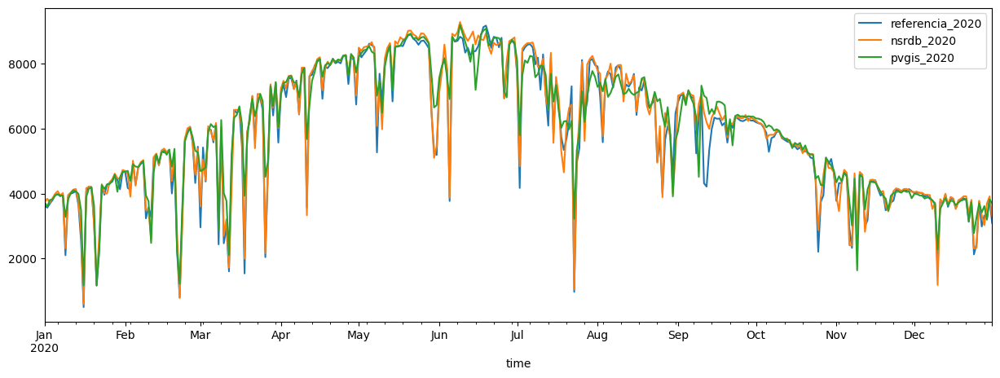

In [17]:
# @title
# @title
df_weather_ghi_horario_2020.resample("D").sum().plot(label ='referencia_2020', figsize=(15,5))
data_nsrdb_2020['ghi'].resample('D').sum().plot(label ='nsrdb_2020', figsize=(15,5))
df_2020['poa_global_2020'].resample('D').sum().plot(label ='pvgis_2020', figsize=(15,5))
plt.legend()

**2021**

 * **MEDICOES LOCAIS UAT**

In [18]:
# @title
# @title
#Importando os Dados da Estação Solarimátrica
#Localização da Universidade de Arizona (OASIS)

df_weather_2021 = pvlib.iotools.read_midc_raw_data_from_nrel('UAT',               # Station id
                                                    pd.Timestamp('20210101'),   # Start date jan 2021
                                                    pd.Timestamp('20211231'))   # End date dez 2021

# Rename columns to match expected names
df_weather_2021 = df_weather_2021.rename(columns={
    'Air Temperature [deg C]': 'temp_air',
    'Avg Wind Speed @ 3m [m/s]': 'wind_speed',
    'Diffuse Horiz [W/m^2]': 'dhi',
    'Direct Normal [W/m^2]': 'dni',
    'Global Horiz (platform) [W/m^2]': 'ghi'
})


df_weather_2021.head(3)

,Unnamed: 0,Year,DOY,MST,dni,dhi,Global Horiz (tracker) [W/m^2],ghi,Temp CHP1 [deg C],Temp CM22 (tracker) [deg C],...,CR1000 Temp [deg C],CR1000 Battery [VDC],temp_air,Rel Humidity [%],Station Pressure [mBar],wind_speed,Avg Wind Direction @ 3m [deg from N],Peak Wind Speed @ 3m [m/s],Zenith Angle [degrees],Azimuth Angle [degrees]
2021-01-01 00:00:00-07:00,0,2021,1,0,-0.375696,0.0,-1.85025,-1.90242,-246.9,-246.8,...,11.63,13.55,8.53,22.91,922.557,0.405,72.23,1.70,NaN,NaN
2021-01-01 00:01:00-07:00,0,2021,1,1,-0.433495,0.0,-1.85025,-1.90814,-246.9,-246.8,...,11.62,13.55,8.54,22.92,922.564,0.317,15.03,0.95,NaN,NaN
2021-01-01 00:02:00-07:00,0,2021,1,2,-0.433495,0.0,-1.84409,-1.92528,-246.7,-246.8,...,11.61,13.55,8.54,22.87,922.584,0.000,0.00,0.00,NaN,NaN


* **Mudanca da escala temporal**

In [19]:
# @title
# @title
df_weather_ghi_horario_2021 = df_weather_2021['ghi'].resample("H").mean()

/tmp/ipython-input-578303781.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_weather_ghi_horario_2021 = df_weather_2021['ghi'].resample("H").mean()


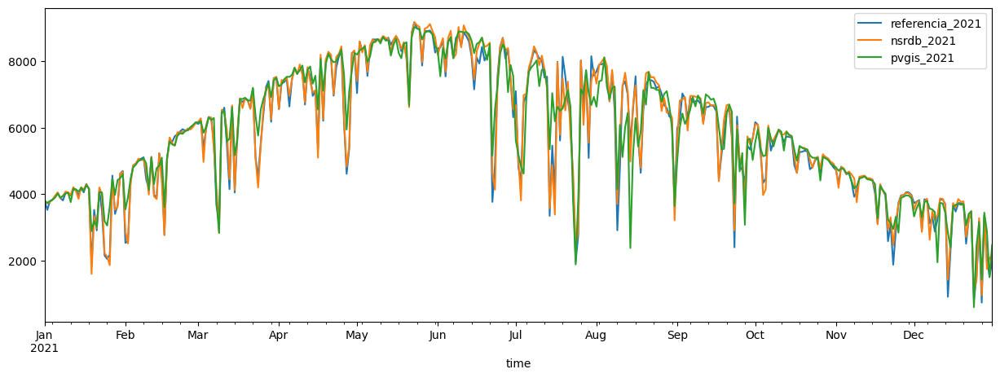

In [20]:
# @title
# @title
df_weather_ghi_horario_2021.resample("D").sum().plot(label ='referencia_2021', figsize=(15,5))
data_nsrdb_2021['ghi'].resample('D').sum().plot(label ='nsrdb_2021', figsize=(15,5))
df_2021['poa_global_2021'].resample('D').sum().plot(label ='pvgis_2021', figsize=(15,5))
plt.legend()

### **1.5.4 Comparação das Métricas de Avaliação**
A escolha do Database metereológico foi baseada nas métricas de avaliação RMSE, MAE e R2 aplicadas nos valores de GHI extraidos das bases de dados NSRDB e PVGIS, em comparação com os dados medidos na estação solarimétrica UAT.


**Ano 2019**

In [21]:
# @title
# @title
daily_reference_2019 = df_weather_ghi_horario_2019.resample("D").sum()
daily_nsrdb_2019 = data_nsrdb_2019['ghi'].resample('D').sum()
daily_pvgis_2019 = df['poa_global'].resample('D').sum()

In [22]:
# @title
# @title
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pvlib.solarposition import get_solarposition
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Métricas de avaliação
rmse = np.sqrt(mean_squared_error(daily_reference_2019, daily_nsrdb_2019))
mae = mean_absolute_error(daily_reference_2019, daily_nsrdb_2019)
r2 = r2_score(daily_reference_2019, daily_nsrdb_2019)
bias = np.mean(daily_nsrdb_2019 - daily_reference_2019)

print("\n--- Métricas de Avaliação NSRDB 2019---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")

rmse = np.sqrt(mean_squared_error(daily_reference_2019, daily_pvgis_2019))
mae = mean_absolute_error(daily_reference_2019, daily_pvgis_2019)
r2 = r2_score(daily_reference_2019, daily_pvgis_2019)
bias = np.mean(daily_nsrdb_2019 - daily_pvgis_2019)

print("\n--- Métricas de Avaliação PVGIS 2019 ---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")


--- Métricas de Avaliação NSRDB 2019---
RMSE: 281.69 W/m²
MAE: 194.07 W/m²
R²: 0.9811
Bias (Calculado - Medido): 105.34 W/m²

--- Métricas de Avaliação PVGIS 2019 ---
RMSE: 550.27 W/m²
MAE: 356.16 W/m²
R²: 0.9278
Bias (Calculado - Medido): nan W/m²


* Constata-se que os dados do NSRDB, para o ano de 2019, possui melhor aderência aos dados medidos pela estação UAT, em comparação com os dados do PVGIS.

**Ano 2020**


In [23]:
# @title
# @title
daily_reference_2020 = df_weather_ghi_horario_2020.resample("D").sum()
daily_nsrdb_2020 = data_nsrdb_2020['ghi'].resample('D').sum()
daily_pvgis_2020 = df_2020['poa_global_2020'].resample('D').sum()

In [24]:
# @title
# @title
#dados do ano de 2020
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pvlib.solarposition import get_solarposition
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Métricas de avaliação
rmse = np.sqrt(mean_squared_error(daily_reference_2020, daily_nsrdb_2020))
mae = mean_absolute_error(daily_reference_2020, daily_nsrdb_2020)
r2 = r2_score(daily_reference_2020, daily_nsrdb_2020)
bias = np.mean(daily_nsrdb_2020 - daily_reference_2020)

print("\n--- Métricas de Avaliação NSRDB 2020---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")

rmse = np.sqrt(mean_squared_error(daily_reference_2020, daily_pvgis_2020))
mae = mean_absolute_error(daily_reference_2020, daily_pvgis_2020)
r2 = r2_score(daily_reference_2020, daily_pvgis_2020)
bias = np.mean(daily_nsrdb_2020 - daily_pvgis_2020)

print("\n--- Métricas de Avaliação PVGIS 2020 ---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")


--- Métricas de Avaliação NSRDB 2020---
RMSE: 305.36 W/m²
MAE: 183.08 W/m²
R²: 0.9755
Bias (Calculado - Medido): 85.95 W/m²

--- Métricas de Avaliação PVGIS 2020 ---
RMSE: 596.01 W/m²
MAE: 338.63 W/m²
R²: 0.9066
Bias (Calculado - Medido): nan W/m²


Constata-se que os dados do NSRDB, para o ano de 2020, continua sendo a base indicada.

**2021**


In [25]:
# @title
# @title
daily_reference_2021 = df_weather_ghi_horario_2021.resample("D").sum()
daily_nsrdb_2021 = data_nsrdb_2021['ghi'].resample('D').sum()
daily_pvgis_2021 = df_2021['poa_global_2021'].resample('D').sum()

In [26]:
# @title
# @title
#dados do ano de 2021
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pvlib.solarposition import get_solarposition
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Métricas de avaliação
rmse = np.sqrt(mean_squared_error(daily_reference_2021, daily_nsrdb_2021))
mae = mean_absolute_error(daily_reference_2021, daily_nsrdb_2021)
r2 = r2_score(daily_reference_2021, daily_nsrdb_2021)
bias = np.mean(daily_nsrdb_2021 - daily_reference_2021)

print("\n--- Métricas de Avaliação NSRDB 2021---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")

rmse = np.sqrt(mean_squared_error(daily_reference_2021, daily_pvgis_2021))
mae = mean_absolute_error(daily_reference_2021, daily_pvgis_2021)
r2 = r2_score(daily_reference_2021, daily_pvgis_2021)
bias = np.mean(daily_nsrdb_2021 - daily_pvgis_2021)

print("\n--- Métricas de Avaliação PVGIS 2021 ---")
print(f"RMSE: {rmse:.2f} W/m²")
print(f"MAE: {mae:.2f} W/m²")
print(f"R²: {r2:.4f}")
print(f"Bias (Calculado - Medido): {bias:.2f} W/m²")


--- Métricas de Avaliação NSRDB 2021---
RMSE: 234.09 W/m²
MAE: 157.09 W/m²
R²: 0.9852
Bias (Calculado - Medido): 41.79 W/m²

--- Métricas de Avaliação PVGIS 2021 ---
RMSE: 613.11 W/m²
MAE: 379.52 W/m²
R²: 0.8984
Bias (Calculado - Medido): nan W/m²


* Novamente, constata-se que os dados do NSRDB, para o ano de 2021, continua sendo a base indicada em comparação com a base de dados do PVGIS.


---




### **1.5.5 Conclusão da Escolha da Base de Dados de Satélite (GHI)**

Em função das análises das métricas de avaliação realizadas nos itens anteriores, a base de dados do NSRDB será adotada para a geração dos dados de GHI, os quais serão utilizados para obter os valores de do DNI e DHI, por meio de diversos métodos de decomposicao.

## **1.6 Métodos de Decomposição para Determinacao do DNI e DHI**


A partir dos valores gerados de GHI da base de dados do NSRDB, os valores de DNI e DHI foram determinados pelos métodos de decomposicao, a saber:

1.   ERBS
2.   DIRINT
3.   DISC
4.   BOLAND

>   Como referência, foram utilizados os programas desenvolvidos no Notebook 3 e auxílio complementar de IA



### **1.6.1 Decomposição referente ao ano de 2019**










In [27]:
# @title
# @title
from pvlib import irradiance
import pvlib # Import pvlib

# Use os dados de 2019 do NSRDB para o cálculo da posição solar
solpos = pvlib.solarposition.get_solarposition(time=data_nsrdb_2019.index,
                                                latitude=latitude,
                                                longitude=longitude)

# O modelo Erbs utiliza o GHI medido e o ângulo zenital solar.
# Usando GHI dos dados de 2019 do NSRDB
out_erbs = irradiance.erbs(data_nsrdb_2019['ghi'], solpos['zenith'], data_nsrdb_2019.index)
out_erbs = out_erbs.rename(columns={'dni': 'dni_erbs', 'dhi': 'dhi_erbs'})

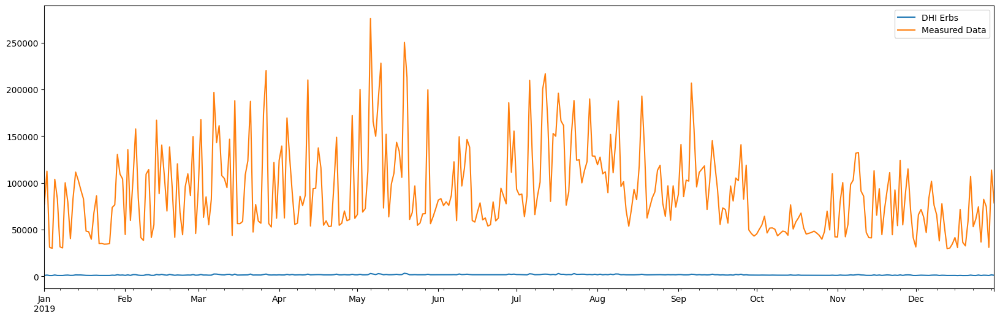

In [28]:
# @title
# @title
out_erbs['dhi_erbs'].resample('D').sum().plot(label = 'DHI Erbs', figsize=(20,6))
df_weather['dhi'].resample('D').sum().plot(label = 'Measured Data')
plt.legend()
plt.show()

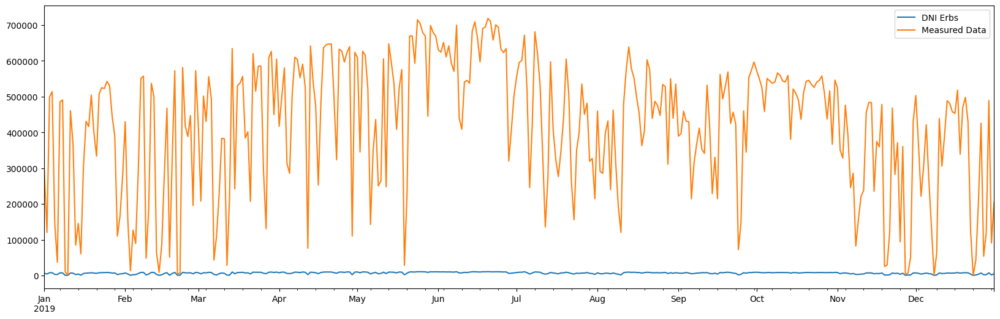

In [29]:
# @title
# @title
out_erbs['dni_erbs'].resample('D').sum().plot(label = 'DNI Erbs', figsize=(20,6))
df_weather['dni'].resample('D').sum().plot(label = 'Measured Data')
plt.legend()
plt.show()

In [30]:
# @title
# @title
#Modelagem de Decomposição com outros modelos de decomposição
#DISC - O modelo DISC utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2019 do NSRDB
out_disc = irradiance.disc(
    data_nsrdb_2019['ghi'], solpos.zenith, data_nsrdb_2019.index, data_nsrdb_2019['pressure']*100)
# use "complete sum" AKA "closure" equations: DHI = GHI - DNI * cos(zenith)
df_disc = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2019['ghi'], dni=out_disc.dni,
    dhi=None)
out_disc = out_disc.rename(columns={'dni': 'dni_disc'})
out_disc['dhi_disc'] = df_disc.dhi

#BOLAND - O modelo Boland utiliza o GHI medido, o ângulo zenital solar e o índice temporal.
# Usando dados de 2019 do NSRDB
out_boland = irradiance.boland(data_nsrdb_2019['ghi'], solpos.zenith, data_nsrdb_2019.index)
out_boland = out_boland.rename(
    columns={'dni': 'dni_boland', 'dhi': 'dhi_boland'})

#DIRINT - O modelo Dirint utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2019 do NSRDB
dni_dirint = irradiance.dirint(
    data_nsrdb_2019['ghi'], solpos.zenith, data_nsrdb_2019.index, data_nsrdb_2019['pressure']*100,
    temp_dew=None)
# use "complete sum" AKA "closure" equation: DHI = GHI - DNI * cos(zenith)
df_dirint = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2019['ghi'], dni=dni_dirint,
    dhi=None)
out_dirint = pd.DataFrame(
    {'dni_dirint': dni_dirint, 'dhi_dirint': df_dirint.dhi},
    index=data_nsrdb_2019.index)

546443.8472519233
523163.2794703701
534744.9623122863
626237.4166953493
33249306.14111601


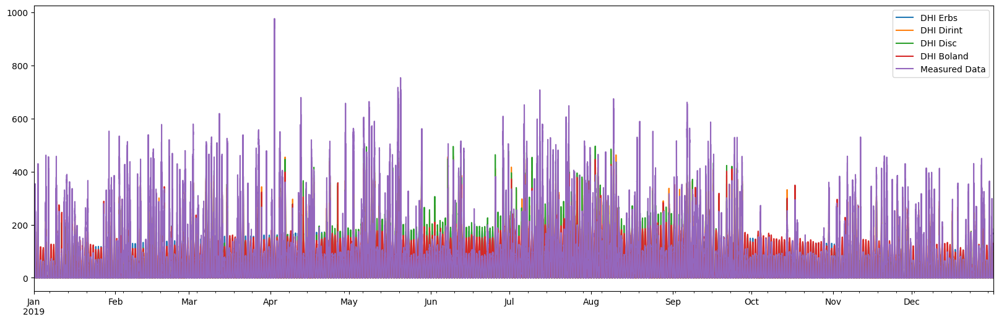

In [31]:
# @title
# @title
#Comparando DHI
out_erbs['dhi_erbs'].plot(label = 'DHI Erbs', figsize=(20,6))
out_dirint['dhi_dirint'].plot(label = 'DHI Dirint')
out_disc['dhi_disc'].plot(label = 'DHI Disc')
out_boland['dhi_boland'].plot(label = 'DHI Boland')
df_weather['dhi'].plot(label = 'Measured Data')
print(out_erbs['dhi_erbs'].sum())
print(out_dirint['dhi_dirint'].sum())
print(out_disc['dhi_disc'].sum())
print(out_boland['dhi_boland'].sum())
print(df_weather['dhi'].sum())
plt.legend()
plt.show()

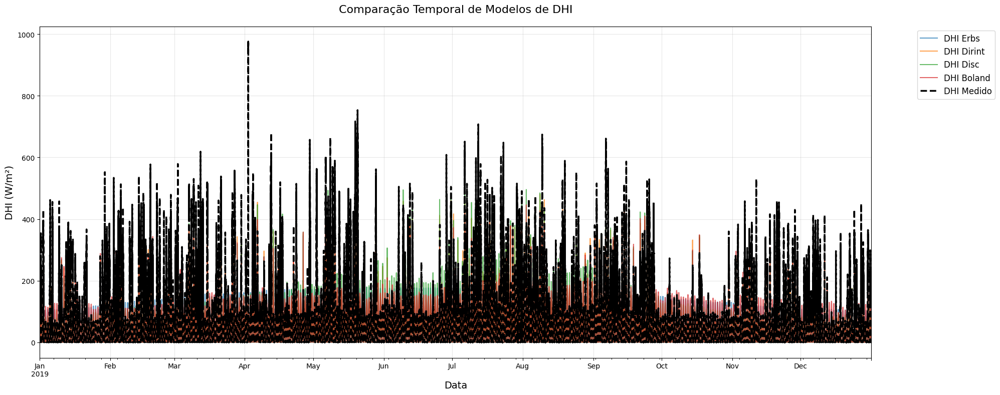

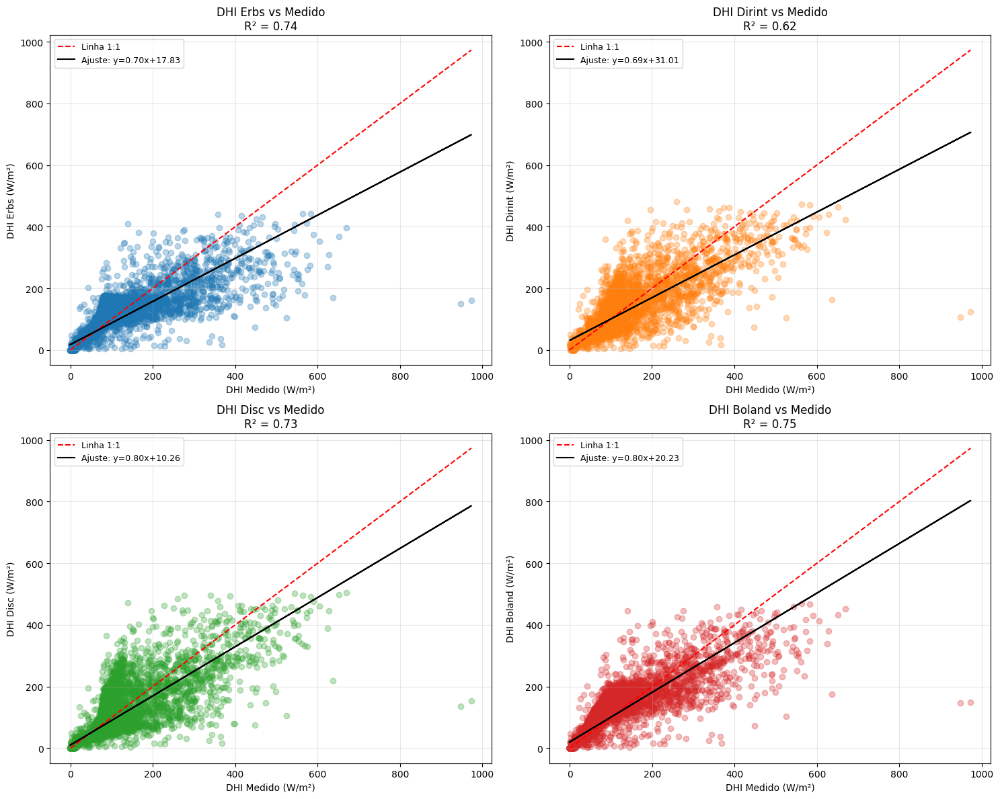

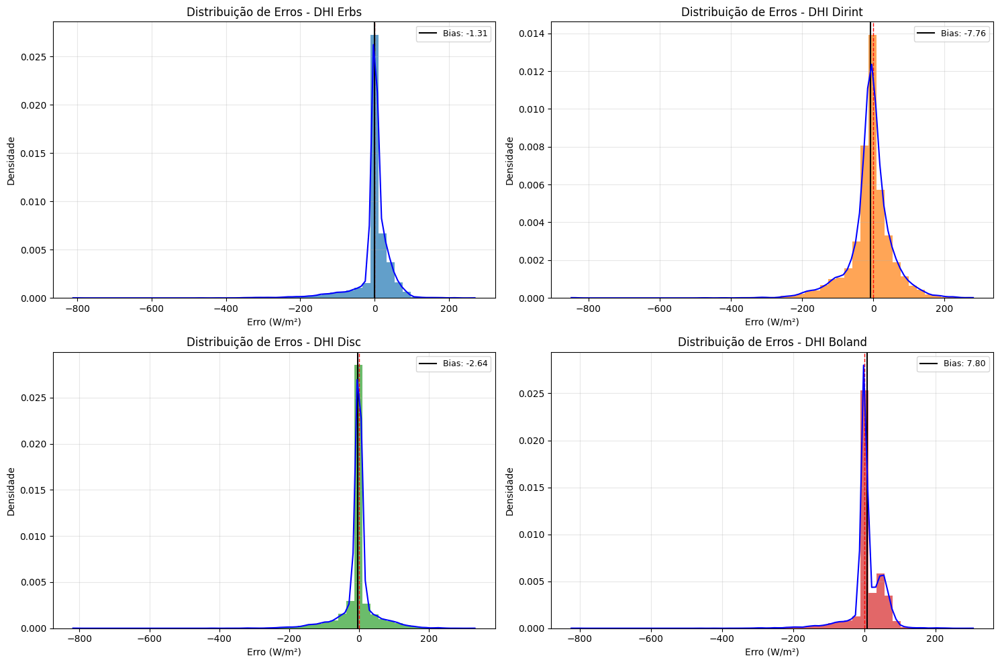

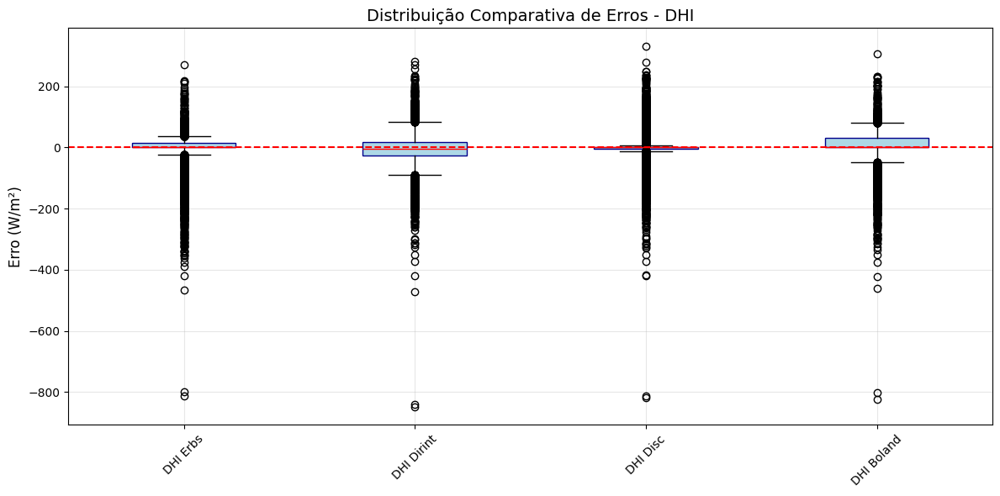

In [32]:
# @title
# @title
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DHI
models_dhi = {
    'DHI Erbs': out_erbs['dhi_erbs'],
    'DHI Dirint': out_dirint['dhi_dirint'],
    'DHI Disc': out_disc['dhi_disc'],
    'DHI Boland': out_boland['dhi_boland']
}

# Dados medidos para DHI
measured_dhi = df_weather['dhi']

# 1. Plot comparativo temporal DHI
plt.figure(figsize=(20, 8))
for name, model in models_dhi.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dhi.plot(label='DHI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DHI', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DHI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DHI
metrics_dhi = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dhi.items():
    valid_idx = measured_dhi.notna() & model.notna()
    y_true = measured_dhi[valid_idx]
    y_pred = model[valid_idx]

    # Check if there are enough samples for metrics calculation
    if len(y_true) > 1:
        metrics_dhi.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
        metrics_dhi.loc[name] = {col: np.nan for col in metrics_dhi.columns}


# 3. Gráficos de dispersão com ajuste linear para DHI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dhi.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dhi.notna() & model.notna()
    x = measured_dhi[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        coef = np.polyfit(x, y, 1)
        poly1d_fn = np.poly1d(coef)
        plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')

        plt.xlabel('DHI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido\nR² = {metrics_dhi.loc[name, "R²"]:.2f}', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')

plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DHI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dhi.items(), 1):
    error = model - measured_dhi

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name}', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DHI
plt.figure(figsize=(12, 6))
all_errors_dhi = []
labels_dhi = []
for name, model in models_dhi.items():
    error = model - measured_dhi
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dhi.append(clean_error)
        labels_dhi.append(name)

if len(all_errors_dhi) > 0:
    plt.boxplot(all_errors_dhi, tick_labels=labels_dhi, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DHI', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DHI.")

# Calculate total energy for DHI
energy_dhi = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dhi.items():
    energy_dhi.loc[name] = model.sum()
energy_dhi.loc['Dados Medidos'] = measured_dhi.sum()

2520496.7339820834
2633744.728839728
2659026.4197834213
2357155.214142291
152343142.62619603


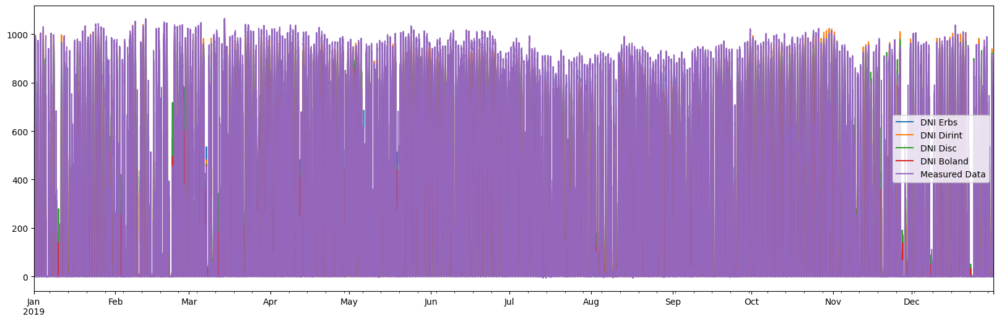

In [33]:
# @title
# @title
#Comparando DNI
out_erbs['dni_erbs'].plot(label = 'DNI Erbs', figsize=(20,6))
out_dirint['dni_dirint'].plot(label = 'DNI Dirint')
out_disc['dni_disc'].plot(label = 'DNI Disc')
out_boland['dni_boland'].plot(label = 'DNI Boland')
df_weather['dni'].plot(label = 'Measured Data')
print(out_erbs['dni_erbs'].sum())
print(out_dirint['dni_dirint'].sum())
print(out_disc['dni_disc'].sum())
print(out_boland['dni_boland'].sum())
print(df_weather['dni'].sum())
plt.legend()
plt.show()

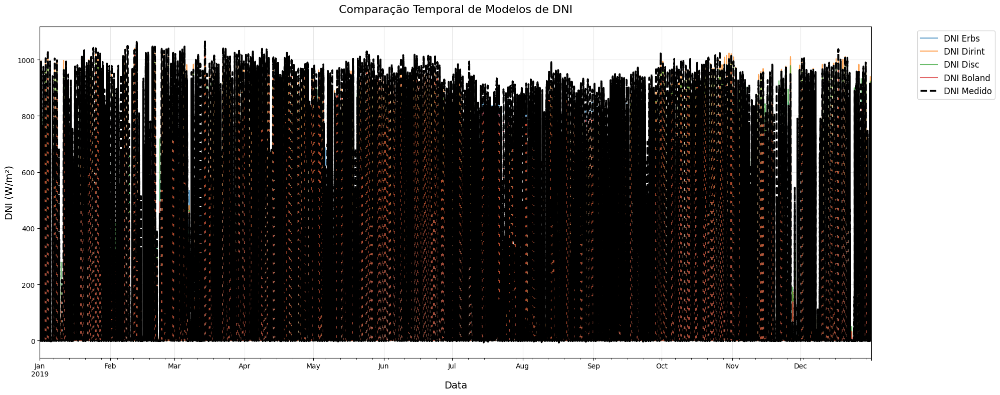

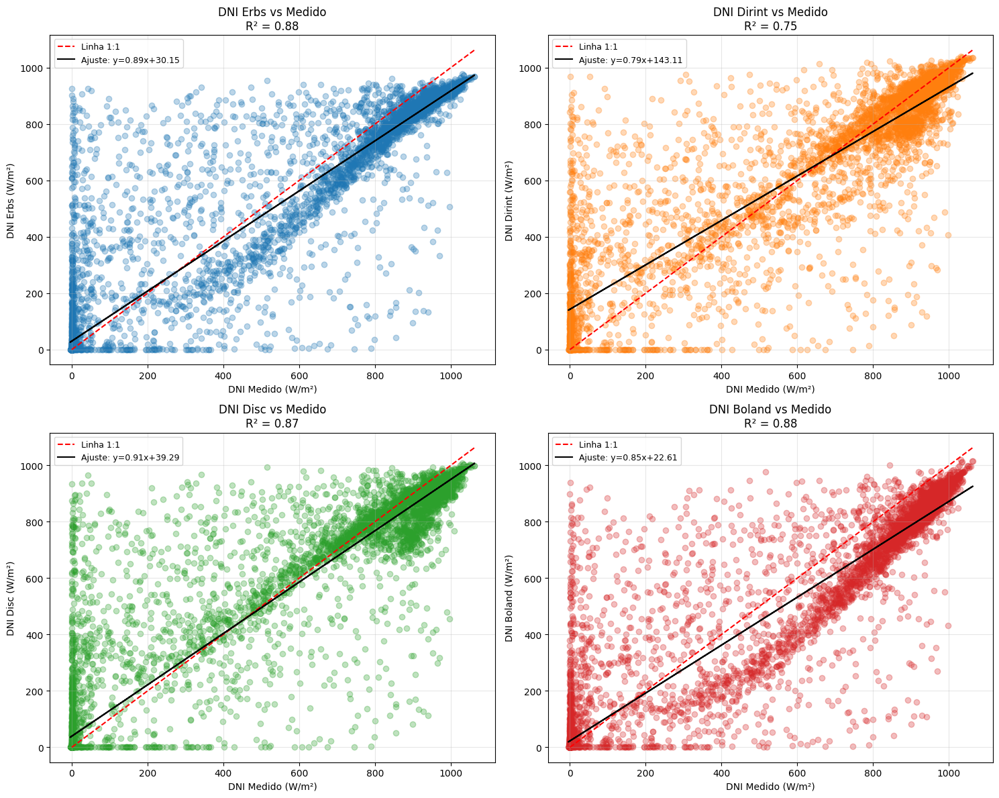

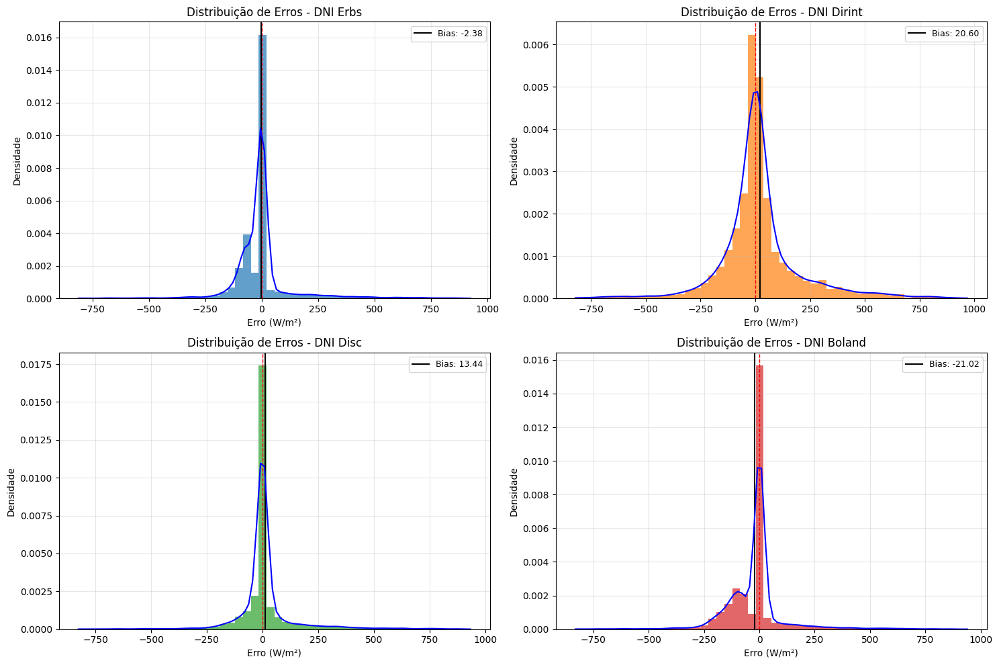

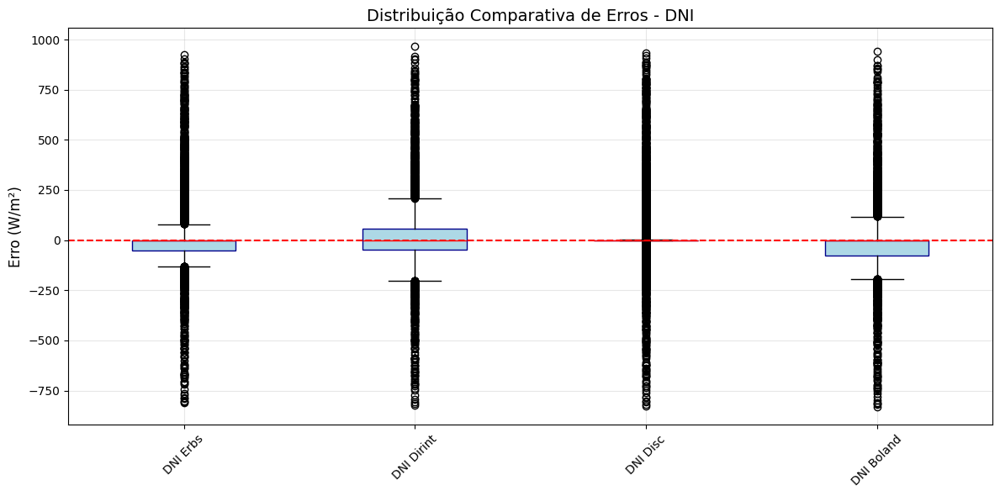


=== Métricas de Desempenho Combinadas (DHI e DNI) ===
                                    RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  \
Irradiance Component Model                                                      
DHI                  DHI Erbs             49.62       22.90 0.74        -1.31   
                     DHI Dirint           64.42       40.37 0.62        -7.76   
                     DHI Disc             50.26       23.14 0.73        -2.64   
                     DHI Boland           48.32       25.39 0.75         7.80   
DNI                  DNI Erbs            135.15       61.80 0.88        -2.38   
                     DNI Dirint          186.24      111.05 0.75        20.60   
                     DNI Disc            139.09       58.89 0.87        13.44   
                     DNI Boland          136.62       69.64 0.88       -21.02   
DHI                  Dados Medidos          NaN         NaN  NaN          NaN   
DNI                  Dados Medidos          NaN       

In [34]:
# @title
# @title
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DNI
models_dni = {
    'DNI Erbs': out_erbs['dni_erbs'],
    'DNI Dirint': out_dirint['dni_dirint'],
    'DNI Disc': out_disc['dni_disc'],
    'DNI Boland': out_boland['dni_boland']
}

# Dados medidos para DNI
measured_dni = df_weather['dni']

# 1. Plot comparativo temporal DNI
plt.figure(figsize=(20, 8))
for name, model in models_dni.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dni.plot(label='DNI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DNI', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DNI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DNI
metrics_dni = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dni.items():
    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model)
    y_true = measured_dni[valid_idx]
    y_pred = model[valid_idx]

    if len(y_true) > 1:
        metrics_dni.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
         metrics_dni.loc[name] = {col: np.nan for col in metrics_dni.columns}


# 3. Gráficos de dispersão com ajuste linear para DNI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dni.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model) & ~np.isinf(measured_dni)
    x = measured_dni[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        try:
            coef = np.polyfit(x, y, 1)
            poly1d_fn = np.poly1d(coef)
            plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')
            r2 = r2_score(x, y)
        except:
            r2 = np.nan

        plt.xlabel('DNI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido\nR² = {r2:.2f}' if not np.isnan(r2) else f'{name} vs Medido', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')


plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DNI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dni.items(), 1):
    error = model - measured_dni

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name}', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DNI
plt.figure(figsize=(12, 6))
all_errors_dni = []
labels_dni = []
for name, model in models_dni.items():
    error = model - measured_dni
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dni.append(clean_error)
        labels_dni.append(name)

if len(all_errors_dni) > 0:
    plt.boxplot(all_errors_dni, tick_labels=labels_dni, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DNI', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DNI.")

# Calculate total energy for DNI
energy_dni = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dni.items():
    energy_dni.loc[name] = model.sum()
energy_dni.loc['Dados Medidos'] = measured_dni.sum()

# Combine metrics into a single table
metrics_combined = pd.concat([metrics_dhi, metrics_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])
energy_combined = pd.concat([energy_dhi, energy_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])

# Add measured data row to the combined metrics table
metrics_combined.loc[('DHI', 'Dados Medidos'), :] = np.nan
metrics_combined.loc[('DNI', 'Dados Medidos'), :] = np.nan

# Combine metrics and energy
combined_results = pd.concat([metrics_combined, energy_combined], axis=1)

# Display the combined table
pd.set_option('display.float_format', '{:.2f}'.format)
print("\n=== Métricas de Desempenho Combinadas (DHI e DNI) ===")
print(combined_results)

**Conclusões para ano de 2019:**

Após as simulações, foi possível verificar que, em relação ao RMSE:

*  DHI: Boland apresentou melhor resultado, pois os seus dados estão mais aderente aos dados medidos na estação da UAT;
*  DNI: Erbs apresentou o melhor resultado, seguido por Boland com pequena diferença.

### **1.6.2 Decomposição referente ao ano de 2020**



>

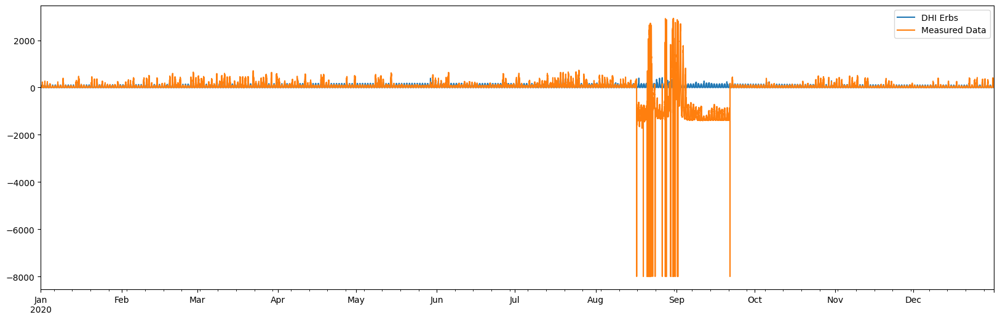

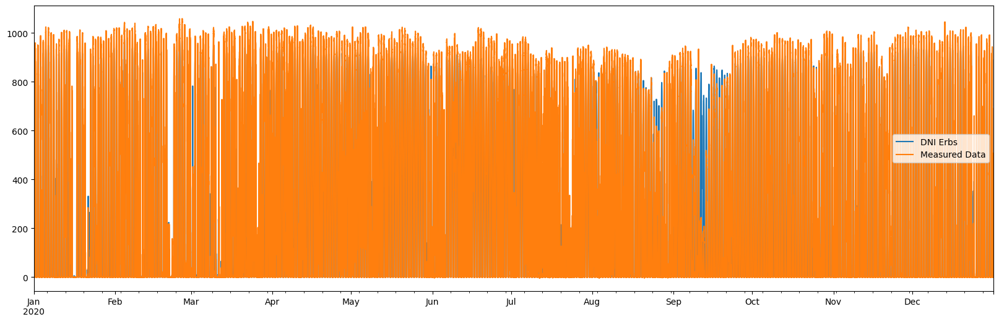

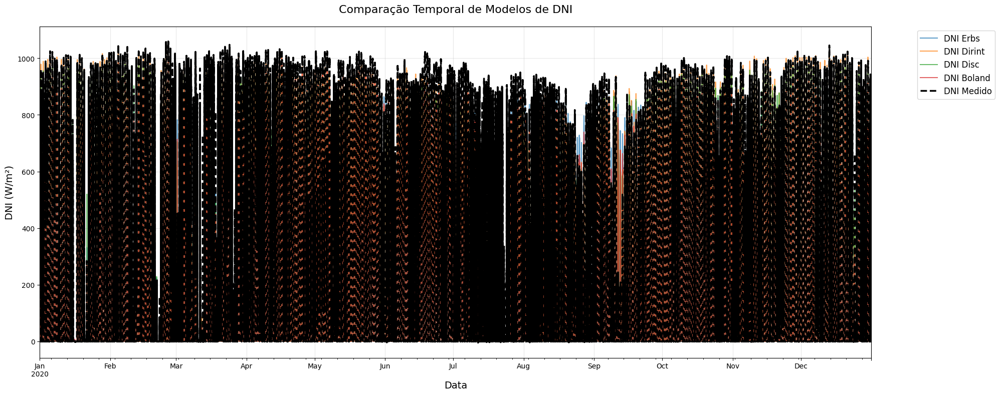

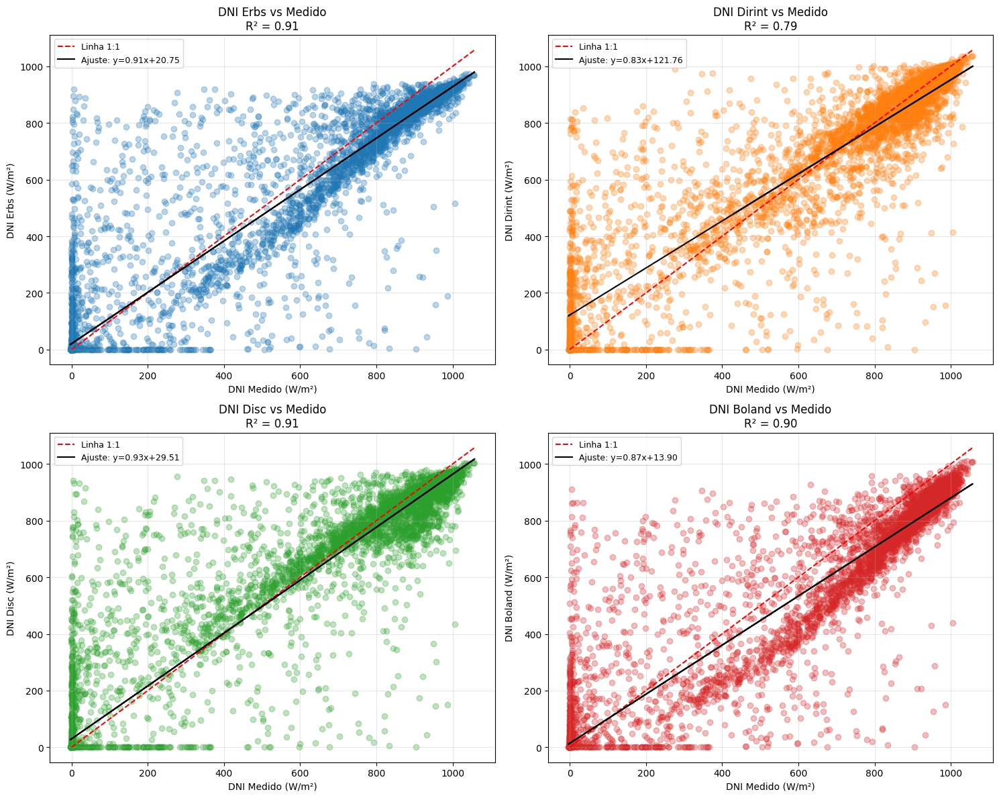

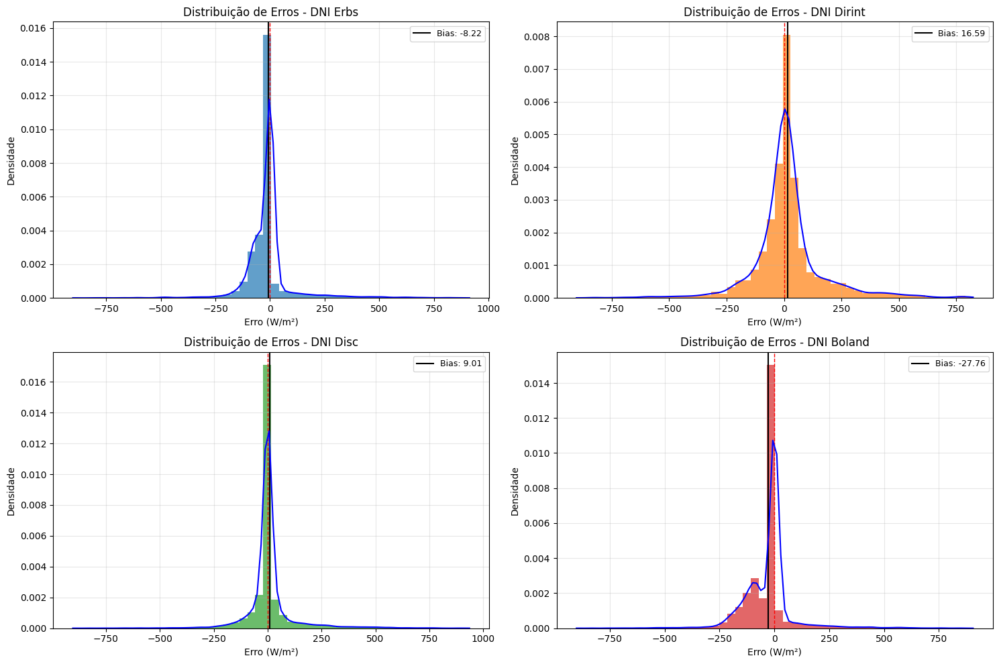

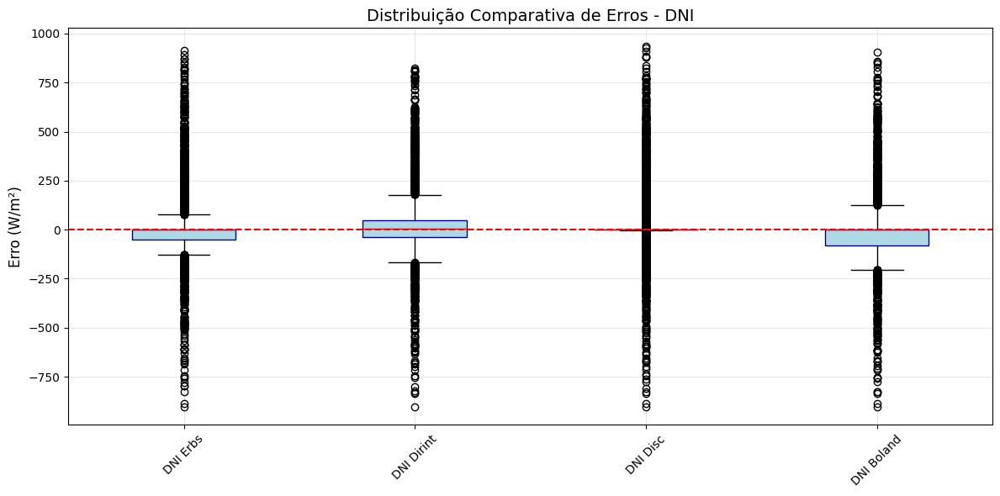


=== Métricas de Desempenho Combinadas (DHI e DNI) ===
                                    RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  \
Irradiance Component Model                                                      
DHI                  DHI Erbs             49.62       22.90 0.74        -1.31   
                     DHI Dirint           64.42       40.37 0.62        -7.76   
                     DHI Disc             50.26       23.14 0.73        -2.64   
                     DHI Boland           48.32       25.39 0.75         7.80   
DNI                  DNI Erbs            118.77       54.08 0.91        -8.22   
                     DNI Dirint          159.71       93.54 0.79        16.59   
                     DNI Disc            118.72       49.41 0.91         9.01   
                     DNI Boland          122.99       63.85 0.90       -27.76   
DHI                  Dados Medidos          NaN         NaN  NaN          NaN   
DNI                  Dados Medidos          NaN       

In [35]:
# @title
from pvlib import irradiance
import pvlib # Import pvlib

# Use os dados de 2020 do NSRDB para o cálculo da posição solar
solpos = pvlib.solarposition.get_solarposition(time=data_nsrdb_2020.index,
                                                latitude=latitude,
                                                longitude=longitude)

# O modelo Erbs utiliza o GHI medido e o ângulo zenital solar.
# Usando GHI dos dados de 2020 do NSRDB
out_erbs = irradiance.erbs(data_nsrdb_2020['ghi'], solpos['zenith'], data_nsrdb_2020.index)
out_erbs = out_erbs.rename(columns={'dni': 'dni_erbs', 'dhi': 'dhi_erbs'})

out_erbs['dhi_erbs'].plot(label = 'DHI Erbs', figsize=(20,6))
df_weather_2020['dhi'].plot(label = 'Measured Data')
plt.legend()
plt.show()

out_erbs['dni_erbs'].plot(label = 'DNI Erbs', figsize=(20,6))
df_weather_2020['dni'].plot(label = 'Measured Data')
plt.legend()
plt.show()

#Modelagem de Decomposição com outros modelos de decomposição
#DISC - O modelo DISC utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2020 do NSRDB
out_disc = irradiance.disc(
    data_nsrdb_2020['ghi'], solpos.zenith, data_nsrdb_2020.index, data_nsrdb_2020['pressure']*100)
# use "complete sum" AKA "closure" equations: DHI = GHI - DNI * cos(zenith)
df_disc = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2020['ghi'], dni=out_disc.dni,
    dhi=None)
out_disc = out_disc.rename(columns={'dni': 'dni_disc'})
out_disc['dhi_disc'] = df_disc.dhi

#BOLAND - O modelo Boland utiliza o GHI medido, o ângulo zenital solar e o índice temporal.
# Usando dados de 2020 do NSRDB
out_boland = irradiance.boland(data_nsrdb_2020['ghi'], solpos.zenith, data_nsrdb_2020.index)
out_boland = out_boland.rename(
    columns={'dni': 'dni_boland', 'dhi': 'dhi_boland'})

#DIRINT - O modelo Dirint utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2020 do NSRDB
dni_dirint = irradiance.dirint(
    data_nsrdb_2020['ghi'], solpos.zenith, data_nsrdb_2020.index, data_nsrdb_2020['pressure']*100,
    temp_dew=None)
# use "complete sum" AKA "closure" equation: DHI = GHI - DNI * cos(zenith)
df_dirint = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2020['ghi'], dni=dni_dirint,
    dhi=None)
out_dirint = pd.DataFrame(
    {'dni_dirint': dni_dirint, 'dhi_dirint': df_dirint.dhi},
    index=data_nsrdb_2020.index)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DNI
models_dni = {
    'DNI Erbs': out_erbs['dni_erbs'],
    'DNI Dirint': out_dirint['dni_dirint'],
    'DNI Disc': out_disc['dni_disc'],
    'DNI Boland': out_boland['dni_boland']
}

# Dados medidos para DNI
measured_dni = df_weather_2020['dni']

# 1. Plot comparativo temporal DNI
plt.figure(figsize=(20, 8))
for name, model in models_dni.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dni.plot(label='DNI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DNI', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DNI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DNI
metrics_dni = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dni.items():
    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model)
    y_true = measured_dni[valid_idx]
    y_pred = model[valid_idx]

    if len(y_true) > 1:
        metrics_dni.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
         metrics_dni.loc[name] = {col: np.nan for col in metrics_dni.columns}


# 3. Gráficos de dispersão com ajuste linear para DNI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dni.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model) & ~np.isinf(measured_dni)
    x = measured_dni[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        try:
            coef = np.polyfit(x, y, 1)
            poly1d_fn = np.poly1d(coef)
            plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')
            r2 = r2_score(x, y)
        except:
            r2 = np.nan

        plt.xlabel('DNI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido\nR² = {r2:.2f}' if not np.isnan(r2) else f'{name} vs Medido', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')


plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DNI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dni.items(), 1):
    error = model - measured_dni

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name}', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DNI
plt.figure(figsize=(12, 6))
all_errors_dni = []
labels_dni = []
for name, model in models_dni.items():
    error = model - measured_dni
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dni.append(clean_error)
        labels_dni.append(name)

if len(all_errors_dni) > 0:
    plt.boxplot(all_errors_dni, tick_labels=labels_dni, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DNI', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DNI.")

# Calculate total energy for DNI
energy_dni = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dni.items():
    energy_dni.loc[name] = model.sum()
energy_dni.loc['Dados Medidos'] = measured_dni.sum()

# Combine metrics into a single table
metrics_combined = pd.concat([metrics_dhi, metrics_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])
energy_combined = pd.concat([energy_dhi, energy_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])

# Add measured data row to the combined metrics table
metrics_combined.loc[('DHI', 'Dados Medidos'), :] = np.nan
metrics_combined.loc[('DNI', 'Dados Medidos'), :] = np.nan

# Combine metrics and energy
combined_results = pd.concat([metrics_combined, energy_combined], axis=1)

# Display the combined table
pd.set_option('display.float_format', '{:.2f}'.format)
print("\n=== Métricas de Desempenho Combinadas (DHI e DNI) ===")
print(combined_results)

**Conclusões para ano de 2020:**

Após as simulações, foi possível verificar que, em relação ao RMSE:

*  DHI: Boland teve melhor resultado, sendo mais aderente aos dados medidos;
*  DNI: Disc teve o melhor resultado, seguido por Erbs com pequena diferença.




---



---



### **1.6.3 Decomposição referente ao ano de 2021**

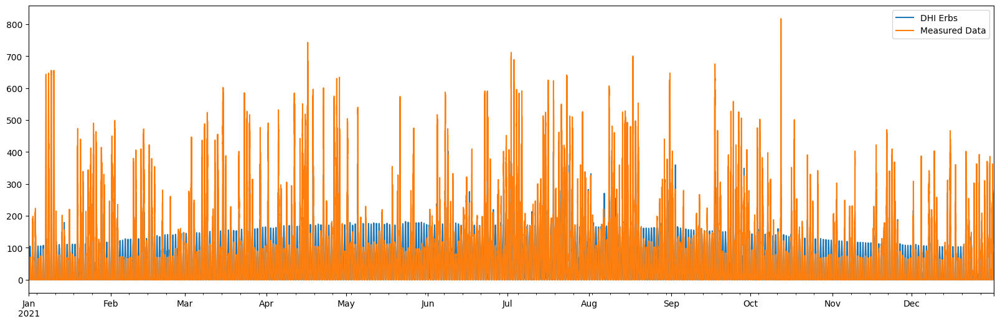

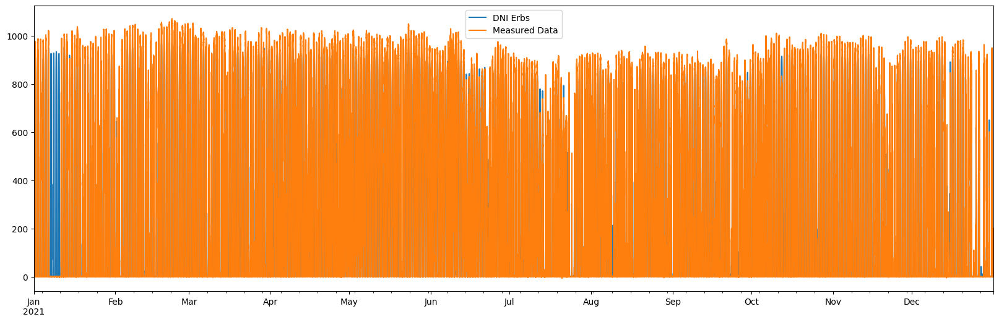

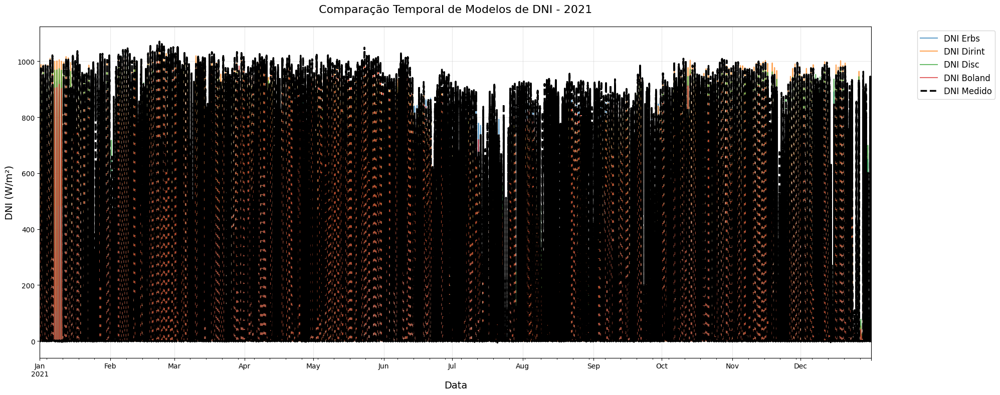

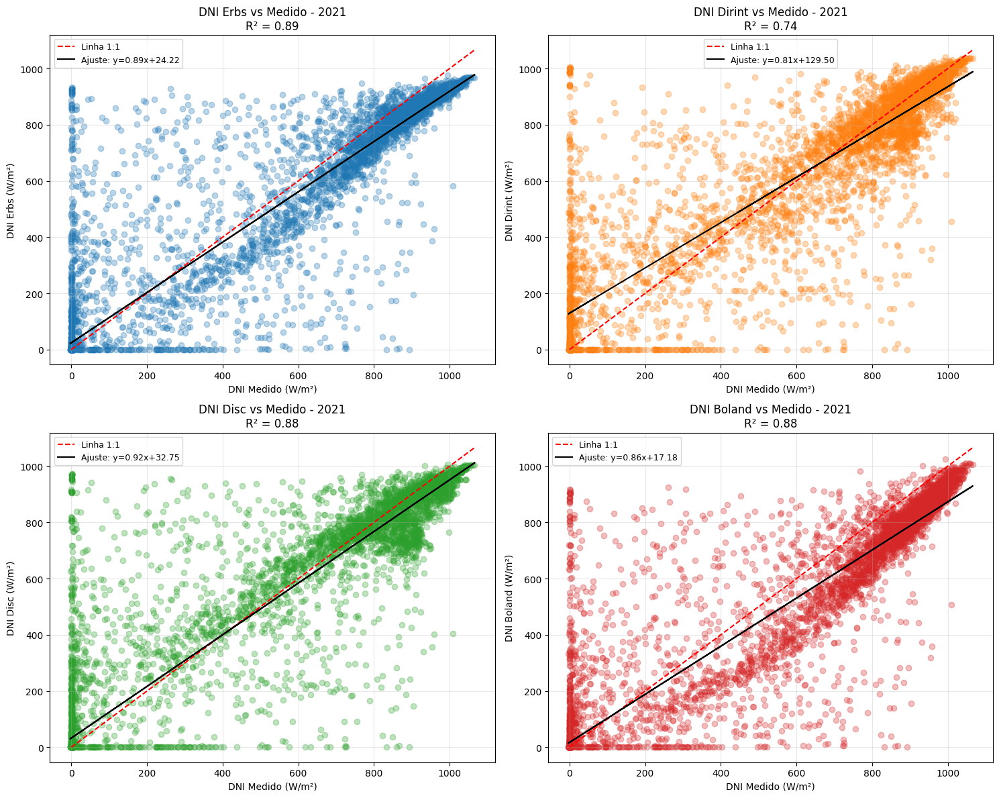

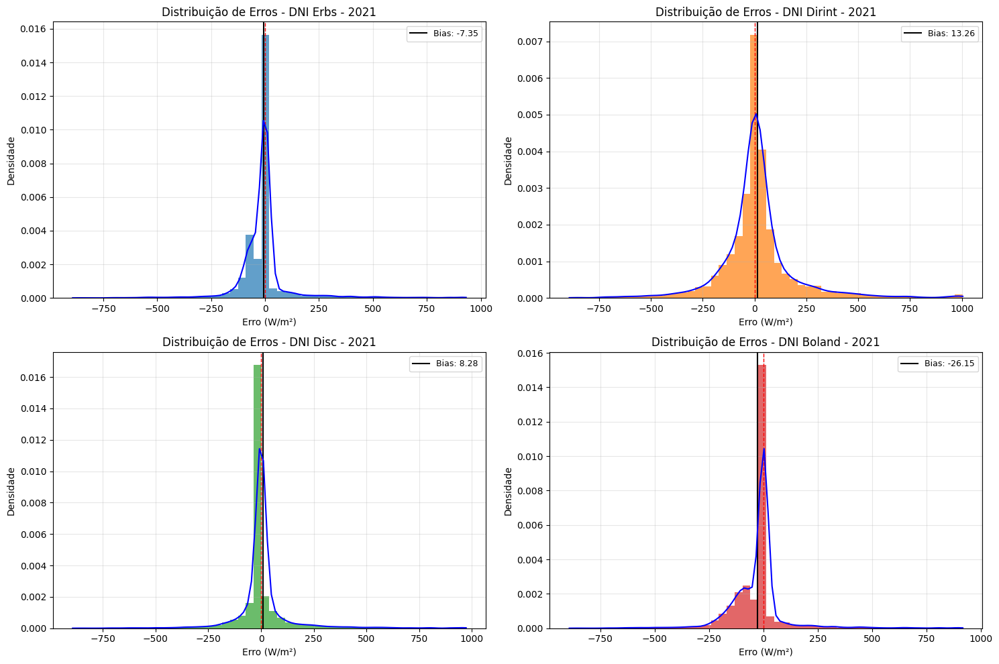

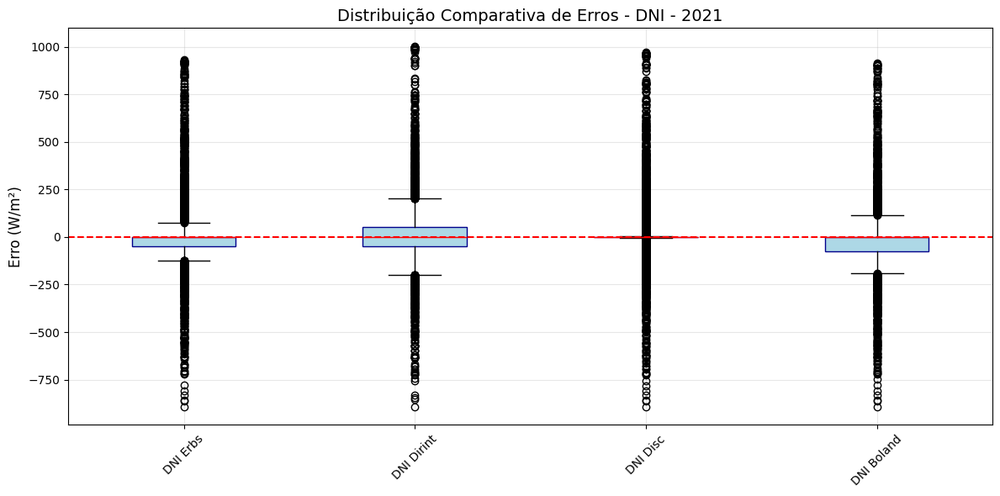


=== Métricas de Desempenho Combinadas (DHI e DNI) - 2021 ===
                                    RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  \
Irradiance Component Model                                                      
DHI                  DHI Erbs             49.62       22.90 0.74        -1.31   
                     DHI Dirint           64.42       40.37 0.62        -7.76   
                     DHI Disc             50.26       23.14 0.73        -2.64   
                     DHI Boland           48.32       25.39 0.75         7.80   
DNI                  DNI Erbs            132.12       57.62 0.89        -7.35   
                     DNI Dirint          184.45      106.88 0.74        13.26   
                     DNI Disc            134.84       55.08 0.88         8.28   
                     DNI Boland          135.37       66.79 0.88       -26.15   
DHI                  Dados Medidos          NaN         NaN  NaN          NaN   
DNI                  Dados Medidos          NaN

In [36]:
# @title
from pvlib import irradiance
import pvlib # Import pvlib

# Use os dados de 2021 do NSRDB para o cálculo da posição solar
solpos = pvlib.solarposition.get_solarposition(time=data_nsrdb_2021.index,
                                                latitude=latitude,
                                                longitude=longitude)

# O modelo Erbs utiliza o GHI medido e o ângulo zenital solar.
# Usando GHI dos dados de 2021 do NSRDB
out_erbs = irradiance.erbs(data_nsrdb_2021['ghi'], solpos['zenith'], data_nsrdb_2021.index)
out_erbs = out_erbs.rename(columns={'dni': 'dni_erbs', 'dhi': 'dhi_erbs'})

out_erbs['dhi_erbs'].plot(label = 'DHI Erbs', figsize=(20,6))
df_weather_2021['dhi'].plot(label = 'Measured Data')
plt.legend()
plt.show()

out_erbs['dni_erbs'].plot(label = 'DNI Erbs', figsize=(20,6))
df_weather_2021['dni'].plot(label = 'Measured Data')
plt.legend()
plt.show()

#Modelagem de Decomposição com outros modelos de decomposição
#DISC - O modelo DISC utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2021 do NSRDB
out_disc = irradiance.disc(
    data_nsrdb_2021['ghi'], solpos.zenith, data_nsrdb_2021.index, data_nsrdb_2021['pressure']*100)
# use "complete sum" AKA "closure" equations: DHI = GHI - DNI * cos(zenith)
df_disc = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2021['ghi'], dni=out_disc.dni,
    dhi=None)
out_disc = out_disc.rename(columns={'dni': 'dni_disc'})
out_disc['dhi_disc'] = df_disc.dhi

#BOLAND - O modelo Boland utiliza o GHI medido, o ângulo zenital solar e o índice temporal.
# Usando dados de 2021 do NSRDB
out_boland = irradiance.boland(data_nsrdb_2021['ghi'], solpos.zenith, data_nsrdb_2021.index)
out_boland = out_boland.rename(
    columns={'dni': 'dni_boland', 'dhi': 'dhi_boland'})

#DIRINT - O modelo Dirint utiliza o GHI medido, o ângulo zenital solar, o índice temporal e a pressão do ar.
# Usando dados de 2021 do NSRDB
dni_dirint = irradiance.dirint(
    data_nsrdb_2021['ghi'], solpos.zenith, data_nsrdb_2021.index, data_nsrdb_2021['pressure']*100,
    temp_dew=None)
# use "complete sum" AKA "closure" equation: DHI = GHI - DNI * cos(zenith)
df_dirint = irradiance.complete_irradiance(
    solar_zenith=solpos.apparent_zenith, ghi=data_nsrdb_2021['ghi'], dni=dni_dirint,
    dhi=None)
out_dirint = pd.DataFrame(
    {'dni_dirint': dni_dirint, 'dhi_dirint': df_dirint.dhi},
    index=data_nsrdb_2021.index)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import gaussian_kde

# Dados dos modelos para DNI
models_dni = {
    'DNI Erbs': out_erbs['dni_erbs'],
    'DNI Dirint': out_dirint['dni_dirint'],
    'DNI Disc': out_disc['dni_disc'],
    'DNI Boland': out_boland['dni_boland']
}

# Dados medidos para DNI
measured_dni = df_weather_2021['dni']

# 1. Plot comparativo temporal DNI
plt.figure(figsize=(20, 8))
for name, model in models_dni.items():
    model.plot(label=name, alpha=0.7, linewidth=1.5)
measured_dni.plot(label='DNI Medido', color='black', linewidth=2.5, style='--')
plt.title('Comparação Temporal de Modelos de DNI - 2021', fontsize=16, pad=20)
plt.xlabel('Data', fontsize=14)
plt.ylabel('DNI (W/m²)', fontsize=14)
plt.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Cálculo das métricas para DNI
metrics_dni = pd.DataFrame(columns=['RMSE (W/m²)', 'MAE (W/m²)', 'R²', 'Bias (W/m²)'])

for name, model in models_dni.items():
    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model)
    y_true = measured_dni[valid_idx]
    y_pred = model[valid_idx]

    if len(y_true) > 1:
        metrics_dni.loc[name] = {
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAE (W/m²)': mean_absolute_error(y_true, y_pred),
            'R²': r2_score(y_true, y_pred),
            'Bias (W/m²)': np.mean(y_pred - y_true)
        }
    else:
         metrics_dni.loc[name] = {col: np.nan for col in metrics_dni.columns}


# 3. Gráficos de dispersão com ajuste linear para DNI
plt.figure(figsize=(15, 12))
for i, (name, model) in enumerate(models_dni.items(), 1):
    plt.subplot(2, 2, i)

    valid_idx = measured_dni.notna() & model.notna() & ~np.isinf(model) & ~np.isinf(measured_dni)
    x = measured_dni[valid_idx]
    y = model[valid_idx]

    if len(x) > 1:
        plt.scatter(x, y, alpha=0.3, color=plt.cm.tab10(i-1))
        plt.plot([0, max(x)], [0, max(x)], 'r--', label='Linha 1:1')

        try:
            coef = np.polyfit(x, y, 1)
            poly1d_fn = np.poly1d(coef)
            plt.plot(x, poly1d_fn(x), 'k-', label=f'Ajuste: y={coef[0]:.2f}x+{coef[1]:.2f}')
            r2 = r2_score(x, y)
        except:
            r2 = np.nan

        plt.xlabel('DNI Medido (W/m²)', fontsize=10)
        plt.ylabel(f'{name} (W/m²)', fontsize=10)
        plt.title(f'{name} vs Medido - 2021\nR² = {r2:.2f}' if not np.isnan(r2) else f'{name} vs Medido - 2021', fontsize=12)
        plt.legend(fontsize=9)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'{name} (Dados insuficientes)')


plt.tight_layout()
plt.show()

# 4. Análise de distribuição de erros para DNI
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dni.items(), 1):
    error = model - measured_dni

    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) == 0:
        plt.subplot(2, 2, i)
        plt.text(0.5, 0.5, 'Dados insuficientes', ha='center', va='center')
        plt.title(f'Distribuição de Erros - {name}')
        continue

    plt.subplot(2, 2, i)
    n, bins, patches = plt.hist(clean_error, bins=50, density=True,
                              alpha=0.7, color=plt.cm.tab10(i-1))
    plt.axvline(x=0, color='r', linestyle='--', linewidth=1)
    current_bias = np.mean(clean_error)
    plt.axvline(x=current_bias, color='k',
               linestyle='-', linewidth=1.5, label=f'Bias: {current_bias:.2f}')

    try:
        kde = gaussian_kde(clean_error)
        x_vals = np.linspace(min(clean_error), max(clean_error), 100)
        plt.plot(x_vals, kde(x_vals), 'b-', linewidth=1.5)
    except Exception as e:
        print(f"\nAviso: Não foi possível calcular KDE para {name}. Erro: {str(e)}")

    plt.title(f'Distribuição de Erros - {name} - 2021', fontsize=12)
    plt.xlabel('Erro (W/m²)', fontsize=10)
    plt.ylabel('Densidade', fontsize=10)
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 5. Boxplot comparativo de erros para DNI
plt.figure(figsize=(12, 6))
all_errors_dni = []
labels_dni = []
for name, model in models_dni.items():
    error = model - measured_dni
    clean_error = error.replace([np.inf, -np.inf], np.nan).dropna()

    if len(clean_error) > 0:
        all_errors_dni.append(clean_error)
        labels_dni.append(name)

if len(all_errors_dni) > 0:
    plt.boxplot(all_errors_dni, tick_labels=labels_dni, patch_artist=True,
               boxprops=dict(facecolor='lightblue', color='darkblue'),
               medianprops=dict(color='red'))
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Distribuição Comparativa de Erros - DNI - 2021', fontsize=14)
    plt.ylabel('Erro (W/m²)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("\nAviso: Não há dados válidos para gerar o boxplot comparativo de DNI.")

# Calculate total energy for DNI
energy_dni = pd.DataFrame(columns=['Energia Total (Wh/m²)'])
for name, model in models_dni.items():
    energy_dni.loc[name] = model.sum()
energy_dni.loc['Dados Medidos'] = measured_dni.sum()

# Combine metrics into a single table
metrics_combined = pd.concat([metrics_dhi, metrics_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])
energy_combined = pd.concat([energy_dhi, energy_dni], keys=['DHI', 'DNI'], names=['Irradiance Component', 'Model'])

# Add measured data row to the combined metrics table
metrics_combined.loc[('DHI', 'Dados Medidos'), :] = np.nan
metrics_combined.loc[('DNI', 'Dados Medidos'), :] = np.nan

# Combine metrics and energy
combined_results = pd.concat([metrics_combined, energy_combined], axis=1)

# Display the combined table
pd.set_option('display.float_format', '{:.2f}'.format)
print("\n=== Métricas de Desempenho Combinadas (DHI e DNI) - 2021 ===")
print(combined_results)

**Conclusões para ano de 2021:**

Após as simulações, foi possível verificar que, em relação ao RMSE:

*  DHI: Boland apresentou melhor resultado, sendo mais aderente aos dados medidos;
*  DNI: Erbs apresentou o melhor resultado.

### **1.6.4 Análise dos Resultados de Decomposicao para 2019 a 2021**: *Um resumo sobre os Achados*

Para modelagem foram escolhidos os dados relativos ao ano de  2021 que apresentaram melhores resultados, conforme a métrica RMSE, em comparação com os dados de 2019 e 2020

O modelo Boland apresentou melhor performance para DHI, enquanto para DNI os modelos Erbs e Disc se alternam como melhores dependendo do critério de avaliação

Definição dos modelos a serem utilizados na modelagem:

- **DHI**
Modelo Boland

- **DNI**
Modelo Erbs

- **GHI**
Valores medidos para o ano de 2021.

### **1.6.5 Criacao de Dataframe com GHI medido e DNI e DHI modelado**



---



---



DATAFRAME CONSOLIDADO CRIADO COM SUCESSO
Dimensões: (8760, 8) (linhas, colunas)
Período: 2021-01-01 00:00:00-07:00 a 2021-12-31 23:00:00-07:00
Fuso horário: Etc/GMT+7

Primeiras 5 linhas:
                           GHI_medido_UAT  DNI_erbs_modelado  \
2021-01-01 00:00:00-07:00            0.00               0.00   
2021-01-01 01:00:00-07:00            0.00               0.00   
2021-01-01 02:00:00-07:00            0.00               0.00   
2021-01-01 03:00:00-07:00            0.00               0.00   
2021-01-01 04:00:00-07:00            0.00               0.00   

                           DHI_boland_modelado  GHI_nsrdb  DNI_nsrdb  \
2021-01-01 00:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 01:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 02:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 03:00:00-07:00                 0.00       0.00       0.00   
2021-01-01 04:00:00-07:00                 0.00       0.00       0.0

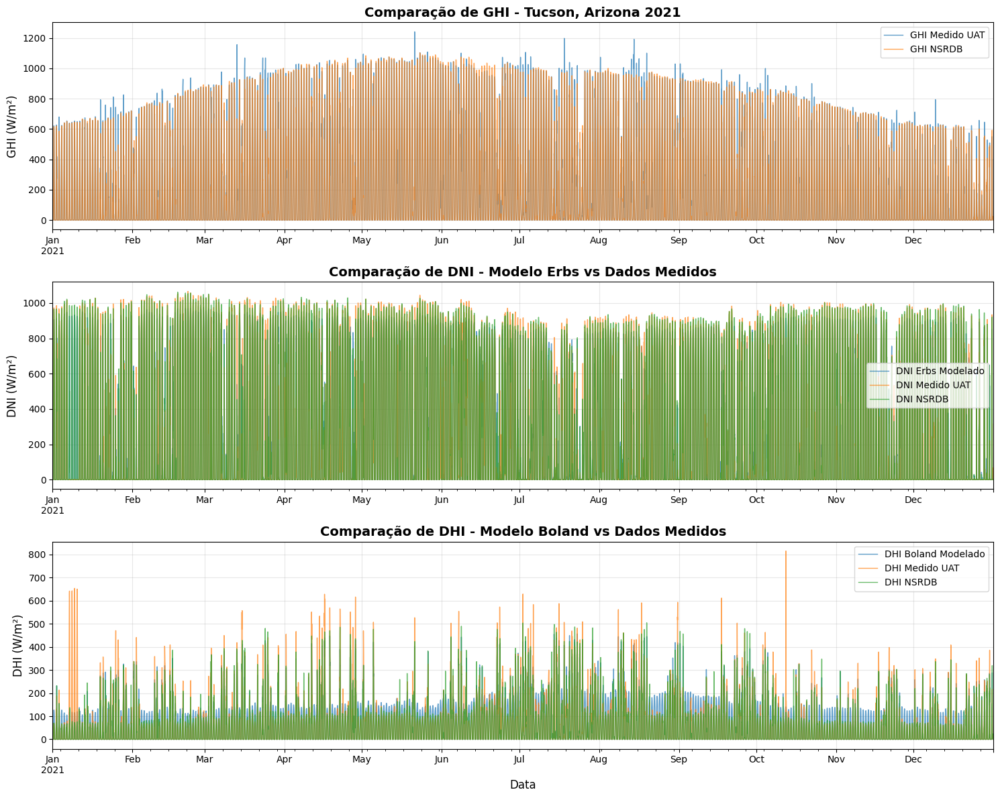


CÁLCULO DE MÉTRICAS DE PERFORMANCE

=== Métricas de Performance dos Modelos ===
(Comparação com dados medidos da estação UAT)
       Modelo  RMSE (W/m²)  MAE (W/m²)   R²  Bias (W/m²)  n_amostras
0    DNI Erbs       132.12       57.42 0.89        -7.55        8760
1  DHI Boland        48.82       24.80 0.74         9.50        8760

ANÁLISE DE CORRELAÇÃO

Matriz de correlação entre variáveis principais:
                     GHI_medido_UAT  DNI_erbs_modelado  DHI_boland_modelado  \
GHI_medido_UAT                 1.00               0.90                 0.79   
DNI_erbs_modelado              0.90               1.00                 0.69   
DHI_boland_modelado            0.79               0.69                 1.00   
GHI_nsrdb                      0.98               0.92                 0.80   
DNI_medido_UAT                 0.89               0.94                 0.63   
DHI_medido_UAT                 0.63               0.50                 0.87   

                     GHI_nsrdb  DNI_med

,GHI_medido_UAT,DNI_erbs_modelado,DHI_boland_modelado,GHI_nsrdb,DNI_nsrdb,DHI_nsrdb,DNI_medido_UAT,DHI_medido_UAT
2021-01-01 00:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 01:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 02:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 03:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 04:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 20:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 21:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 22:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [37]:
# @title
# @title
import pandas as pd
import numpy as np
from pvlib import irradiance, solarposition
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Criar DataFrame consolidado com os dados solicitados
# Usamos o índice do NSRDB 2021 como base temporal
df_consolidado = pd.DataFrame(index=data_nsrdb_2021.index)

# 1. GHI MEDIDO DA ESTAÇÃO UAT (Universidade do Arizona)
# Adiciona o GHI medido pela estação terrestre UAT ao DataFrame
df_consolidado['GHI_medido_UAT'] = df_weather_2021['ghi']

# 2. CÁLCULO DA POSIÇÃO SOLAR
# Necessário para os modelos de decomposição (Erbs e Boland)
solpos = pvlib.solarposition.get_solarposition(
    time=data_nsrdb_2021.index,  # Usa o índice temporal do NSRDB 2021
    latitude=latitude,           # Latitude de Tucson, Arizona
    longitude=longitude          # Longitude de Tucson, Arizona
)

# 3. DNI MODELADO ERBS BASEADO NO GHI NSRDB
# O modelo Erbs decompõe o GHI em DNI e DHI usando relações empíricas
# Parâmetros: GHI do NSRDB, ângulo zenital solar, e índice temporal
out_erbs = irradiance.erbs(data_nsrdb_2021['ghi'], solpos['zenith'], data_nsrdb_2021.index)
df_consolidado['DNI_erbs_modelado'] = out_erbs['dni']

# 4. DHI MODELADO BOLAND BASEADO NO GHI NSRDB
# O modelo Boland é outro método de decomposição que usa o GHI para estimar DHI
# Parâmetros: GHI do NSRDB, ângulo zenital solar, e índice temporal
out_boland = irradiance.boland(data_nsrdb_2021['ghi'], solpos['zenith'], data_nsrdb_2021.index)
df_consolidado['DHI_boland_modelado'] = out_boland['dhi']

# 5. DADOS ADICIONAIS PARA REFERÊNCIA E COMPARAÇÃO
# Adiciona os dados originais do NSRDB para servir como base de comparação
df_consolidado['GHI_nsrdb'] = data_nsrdb_2021['ghi']      # GHI do NSRDB
df_consolidado['DNI_nsrdb'] = data_nsrdb_2021['dni']      # DNI do NSRDB
df_consolidado['DHI_nsrdb'] = data_nsrdb_2021['dhi']      # DHI do NSRDB

# Adiciona os dados medidos da estação UAT para validação dos modelos
df_consolidado['DNI_medido_UAT'] = df_weather_2021['dni']  # DNI medido UAT
df_consolidado['DHI_medido_UAT'] = df_weather_2021['dhi']  # DHI medido UAT

# 6. LIMPEZA E TRATAMENTO DE DADOS
# Remove valores infinitos que podem causar problemas em cálculos estatísticos
df_consolidado = df_consolidado.replace([np.inf, -np.inf], np.nan)

# Define valores negativos como zero (irradiância não pode ser negativa)
df_consolidado[df_consolidado < 0] = 0

# Preenche valores NaN com zero (principalmente para horas noturnas)
df_consolidado = df_consolidado.fillna(0)

# 7. RELATÓRIO INICIAL DO DATAFRAME
print("="*60)
print("DATAFRAME CONSOLIDADO CRIADO COM SUCESSO")
print("="*60)
print(f"Dimensões: {df_consolidado.shape} (linhas, colunas)")
print(f"Período: {df_consolidado.index.min()} a {df_consolidado.index.max()}")
print(f"Fuso horário: {df_consolidado.index.tz}")

print("\nPrimeiras 5 linhas:")
print(df_consolidado.head())

print("\nÚltimas 5 linhas:")
print(df_consolidado.tail())

print("\nEstatísticas descritivas:")
print(df_consolidado.describe())

# Verificar se há valores missing após o tratamento
print(f"\nValores missing por coluna (após tratamento):")
print(df_consolidado.isnull().sum())

# 8. VISUALIZAÇÃO COMPARATIVA DOS DADOS
print("\n" + "="*60)
print("GERANDO VISUALIZAÇÕES COMPARATIVAS")
print("="*60)

plt.figure(figsize=(15, 12))

# Plot 1: Comparação de GHI
plt.subplot(3, 1, 1)
df_consolidado['GHI_medido_UAT'].plot(label='GHI Medido UAT', alpha=0.7, linewidth=1)
df_consolidado['GHI_nsrdb'].plot(label='GHI NSRDB', alpha=0.7, linewidth=1)
plt.title('Comparação de GHI - Tucson, Arizona 2021', fontsize=14, fontweight='bold')
plt.ylabel('GHI (W/m²)', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Plot 2: Comparação de DNI
plt.subplot(3, 1, 2)
df_consolidado['DNI_erbs_modelado'].plot(label='DNI Erbs Modelado', alpha=0.7, linewidth=1)
df_consolidado['DNI_medido_UAT'].plot(label='DNI Medido UAT', alpha=0.7, linewidth=1)
df_consolidado['DNI_nsrdb'].plot(label='DNI NSRDB', alpha=0.7, linewidth=1)
plt.title('Comparação de DNI - Modelo Erbs vs Dados Medidos', fontsize=14, fontweight='bold')
plt.ylabel('DNI (W/m²)', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Plot 3: Comparação de DHI
plt.subplot(3, 1, 3)
df_consolidado['DHI_boland_modelado'].plot(label='DHI Boland Modelado', alpha=0.7, linewidth=1)
df_consolidado['DHI_medido_UAT'].plot(label='DHI Medido UAT', alpha=0.7, linewidth=1)
df_consolidado['DHI_nsrdb'].plot(label='DHI NSRDB', alpha=0.7, linewidth=1)
plt.title('Comparação de DHI - Modelo Boland vs Dados Medidos', fontsize=14, fontweight='bold')
plt.ylabel('DHI (W/m²)', fontsize=12)
plt.xlabel('Data', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 9. CÁLCULO DE MÉTRICAS DE PERFORMANCE
print("\n" + "="*60)
print("CÁLCULO DE MÉTRICAS DE PERFORMANCE")
print("="*60)

def calcular_metricas(y_true, y_pred, nome):
    """
    Calcula métricas de performance para comparar dados medidos vs modelados

    Parâmetros:
    y_true: dados medidos (ground truth)
    y_pred: dados modelados (previsões)
    nome: nome do modelo para identificação

    Retorna:
    Dicionário com métricas de performance
    """
    # Filtrar apenas valores válidos para análise
    mask = (y_true.notna()) & (y_pred.notna()) & (y_true >= 0) & (y_pred >= 0)
    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]

    if len(y_true_clean) > 0:
        return {
            'Modelo': nome,
            'RMSE (W/m²)': np.sqrt(mean_squared_error(y_true_clean, y_pred_clean)),
            'MAE (W/m²)': mean_absolute_error(y_true_clean, y_pred_clean),
            'R²': r2_score(y_true_clean, y_pred_clean),
            'Bias (W/m²)': np.mean(y_pred_clean - y_true_clean),
            'n_amostras': len(y_true_clean)
        }
    else:
        print(f"Aviso: Não há dados válidos para calcular métricas de {nome}")
        return None

# Calcular métricas para o modelo Erbs (DNI)
metricas_dni = calcular_metricas(
    df_consolidado['DNI_medido_UAT'],
    df_consolidado['DNI_erbs_modelado'],
    'DNI Erbs'
)

# Calcular métricas para o modelo Boland (DHI)
metricas_dhi = calcular_metricas(
    df_consolidado['DHI_medido_UAT'],
    df_consolidado['DHI_boland_modelado'],
    'DHI Boland'
)

# Criar DataFrame com métricas se os cálculos foram bem-sucedidos
if metricas_dni and metricas_dhi:
    df_metricas = pd.DataFrame([metricas_dni, metricas_dhi])
    print("\n=== Métricas de Performance dos Modelos ===")
    print("(Comparação com dados medidos da estação UAT)")
    print(df_metricas.round(3))
else:
    print("Não foi possível calcular todas as métricas")

# 10. ANÁLISE DE CORRELAÇÃO
print("\n" + "="*60)
print("ANÁLISE DE CORRELAÇÃO")
print("="*60)

# Calcular matriz de correlação entre as principais variáveis
variaveis_principais = [
    'GHI_medido_UAT', 'DNI_erbs_modelado', 'DHI_boland_modelado',
    'GHI_nsrdb', 'DNI_medido_UAT', 'DHI_medido_UAT'
]

correlacao = df_consolidado[variaveis_principais].corr()
print("\nMatriz de correlação entre variáveis principais:")
print(correlacao.round(3))

# 11. SALVAR DATAFRAME EM ARQUIVO
print("\n" + "="*60)
print("EXPORTANDO RESULTADOS")
print("="*60)

# Salvar DataFrame consolidado em arquivo CSV
nome_arquivo = 'dados_irradiancia_consolidados_2021.csv'
df_consolidado.to_csv(nome_arquivo)
print(f"DataFrame salvo como '{nome_arquivo}'")

# Salvar apenas as colunas principais em um arquivo separado
colunas_principais = ['GHI_medido_UAT', 'DNI_erbs_modelado', 'DHI_boland_modelado']
df_principal = df_consolidado[colunas_principais]
df_principal.to_csv('dados_principais_irradiancia_2021.csv')
print(f"DataFrame principal (apenas colunas solicitadas) salvo como 'dados_principais_irradiancia_2021.csv'")

# 12. RESUMO FINAL
print("\n" + "="*60)
print("RESUMO DO DATAFRAME CRIADO")
print("="*60)
print("COLUNAS PRINCIPAIS:")
print("1. GHI_medido_UAT: GHI medido pela estação UAT (Tucson)")
print("2. DNI_erbs_modelado: DNI modelado usando Erbs baseado no GHI NSRDB")
print("3. DHI_boland_modelado: DHI modelado usando Boland baseado no GHI NSRDB")

print("\nCOLUNAS DE REFERÊNCIA:")
print("4. GHI_nsrdb, DNI_nsrdb, DHI_nsrdb: Dados originais do NSRDB")
print("5. DNI_medido_UAT, DHI_medido_UAT: Dados medidos da UAT para validação")

print(f"\nPERÍODO: {df_consolidado.index.min().strftime('%Y-%m-%d')} a {df_consolidado.index.max().strftime('%Y-%m-%d')}")
print(f"TOTAL DE REGISTROS: {len(df_consolidado):,}")
print(f"FREQUÊNCIA: Horária")

# Retornar o DataFrame consolidado para uso posterior
print("\nDataFrame pronto para uso!")
df_consolidado

In [38]:
# @title
df_consolidado

,GHI_medido_UAT,DNI_erbs_modelado,DHI_boland_modelado,GHI_nsrdb,DNI_nsrdb,DHI_nsrdb,DNI_medido_UAT,DHI_medido_UAT
2021-01-01 00:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 01:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 02:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 03:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-01-01 04:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 20:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 21:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2021-12-31 22:00:00-07:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


## **1.7 Qualidade do Recurso Solar**

Para compreendermos a qualidade, composição e comportamento do recurso solar no local da usina FV localizada em OASIS- Arizona, foram utilizadas as seguintes ferramentas gráficas de análise solarimétrica:

* Fração difusa (DHI/GHI) vs Índice de claridade (Kt)
* Componentes do recurso solar na horizontal vs ângulo zenital
* Inspeção visual de duas dimensões(GHI, DNI e DHI)

### `Back Ofice`

Esta seccao reproduz as funcoes anteriores através de metodologia distinta para elaboracao do código, aplicando os mesmos principios e fundamentos. Seccoes como esta foram adicionadas ao trabalho com o propósito de confirmar a metodologia proposta e desenvolver o trabalho com qualidade.
Para os fins determinados para o Projeto I, entretando, estas seccoes "Back Ofice" podem ser dispensadas.

In [39]:
# --------------------------------------------
# 1) Definições do local e horário
# --------------------------------------------
Latitude = 32.22969
Longitude = -110.95534
Altitude = 786
tz= 'Etc/GMT-7'


In [40]:
#Import Data -
#Localização da Uat
#### Importando dados da estação solarimetrica **#Universidade de UATs**


df_weather = pvlib.iotools.read_midc_raw_data_from_nrel('UAT',               # ID da estação
                                                    pd.Timestamp('20190101'),   # data de inicio YYYYMMDD
                                                    pd.Timestamp('20211231'))   # data de termino  YYYYMMDD

df_weather.head(100)

,Unnamed: 0,Year,DOY,MST,Direct Normal [W/m^2],Diffuse Horiz [W/m^2],Global Horiz (tracker) [W/m^2],Global Horiz (platform) [W/m^2],Temp CHP1 [deg C],Temp CM22 (tracker) [deg C],...,CR1000 Temp [deg C],CR1000 Battery [VDC],Air Temperature [deg C],Rel Humidity [%],Station Pressure [mBar],Avg Wind Speed @ 3m [m/s],Avg Wind Direction @ 3m [deg from N],Peak Wind Speed @ 3m [m/s],Zenith Angle [degrees],Azimuth Angle [degrees]
2019-01-01 00:00:00-07:00,0,2019,1,0,-0.43,0.00,-1.04,-1.37,-246.80,-246.80,...,7.49,13.53,3.89,87.90,923.39,5.60,115.00,6.95,NaN,NaN
2019-01-01 00:01:00-07:00,0,2019,1,1,-0.29,0.00,-1.11,-1.37,-246.80,-246.80,...,7.49,13.53,3.85,87.90,923.40,6.17,113.90,7.70,NaN,NaN
2019-01-01 00:02:00-07:00,0,2019,1,2,-0.39,0.00,-1.11,-1.37,-246.80,-246.80,...,7.49,13.53,3.84,87.90,923.40,6.91,117.50,8.45,NaN,NaN
2019-01-01 00:03:00-07:00,0,2019,1,3,-0.07,0.00,-1.13,-1.38,-246.80,-246.80,...,7.49,13.53,3.85,87.90,923.44,6.88,112.40,9.20,NaN,NaN
2019-01-01 00:04:00-07:00,0,2019,1,4,0.01,0.00,-1.16,-1.38,-246.80,-246.80,...,7.47,13.53,3.80,87.70,923.42,7.45,116.40,9.20,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-01 01:35:00-07:00,0,2019,1,135,0.12,0.00,-0.96,-1.62,-246.80,-246.80,...,6.68,13.55,2.90,88.50,924.18,6.12,110.40,7.70,NaN,NaN
2019-01-01 01:36:00-07:00,0,2019,1,136,-0.43,0.00,-1.05,-1.66,-246.80,-246.80,...,6.68,13.55,2.90,88.70,924.19,6.00,117.00,8.45,NaN,NaN
2019-01-01 01:37:00-07:00,0,2019,1,137,-0.42,0.00,-1.09,-1.68,-246.80,-246.80,...,6.68,13.55,2.91,88.80,924.22,5.65,119.30,6.95,NaN,NaN
2019-01-01 01:38:00-07:00,0,2019,1,138,0.03,0.00,-1.12,-1.63,-246.80,-246.80,...,6.68,13.55,2.93,88.90,924.25,5.16,115.70,6.20,NaN,NaN


In [41]:
# @title
# @title
df_weather.keys()

Index(['Unnamed: 0', 'Year', 'DOY', 'MST', 'Direct Normal [W/m^2]',
       'Diffuse Horiz [W/m^2]', 'Global Horiz (tracker) [W/m^2]',
       'Global Horiz (platform) [W/m^2]', 'Temp CHP1 [deg C]',
       'Temp CM22 (tracker) [deg C]', 'Temp CM22 (platform) [deg C]',
       'CR1000 Temp [deg C]', 'CR1000 Battery [VDC]',
       'Air Temperature [deg C]', 'Rel Humidity [%]',
       'Station Pressure [mBar]', 'Avg Wind Speed @ 3m [m/s]',
       'Avg Wind Direction @ 3m [deg from N]', 'Peak Wind Speed @ 3m [m/s]',
       'Zenith Angle [degrees]', 'Azimuth Angle [degrees]'],
      dtype='object')

In [42]:
# @title
# @title
#Aplicando a função resample para converter os dados de 1 em 1 minuto para dados horários e atribuindo à uma nova variável
df_weather.Diario = ['ghi', 'dhi', 'dni']
df_weather_horário = df_weather.resample('H').mean()

/tmp/ipython-input-1634733890.py:4: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df_weather.Diario = ['ghi', 'dhi', 'dni']
/tmp/ipython-input-1634733890.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_weather_horário = df_weather.resample('H').mean()


* ##### Importando dados satélite

In [43]:
#===========================================
##### Importando dados satelite PVGIS
#===========================================
start = 2019
end = 2021

pvgis_dataset_ghi_3Y, metadata2021 = pvlib.iotools.get_pvgis_hourly(Latitude, Longitude, start, end,
                               raddatabase='PVGIS-ERA5', components=False, surface_tilt=0,
                               surface_azimuth=0, outputformat='json', usehorizon=True,
                               userhorizon=None, pvcalculation=False, peakpower=None,
                               pvtechchoice='crystSi', mountingplace='free', loss=0,
                               trackingtype=0, optimal_surface_tilt=False, optimalangles=False,
                               url='https://re.jrc.ec.europa.eu/api/', map_variables=True, timeout=30)

In [44]:
pvgis_dataset_ghi_3Y

,poa_global,solar_elevation,temp_air,wind_speed,Int
time,,,,,
2019-01-01 00:30:00+00:00,0.00,-0.92,10.95,5.31,0
2019-01-01 01:30:00+00:00,0.00,0.00,10.09,4.90,0
2019-01-01 02:30:00+00:00,0.00,0.00,9.42,4.62,0
2019-01-01 03:30:00+00:00,0.00,0.00,8.98,4.69,0
2019-01-01 04:30:00+00:00,0.00,0.00,8.51,4.83,0
...,...,...,...,...,...
2021-12-31 19:30:00+00:00,400.04,34.66,15.24,2.41,0
2021-12-31 20:30:00+00:00,446.74,32.63,16.44,4.34,0
2021-12-31 21:30:00+00:00,320.69,27.31,16.87,5.59,0


In [45]:
#===========================================
##### Importando dados satelite NSRDB
#===========================================
# Importando Dados de Satélite da NSRDB - É preciso solicitar a chave de API no site https://developer.nrel.gov/signup/
# Os dados de satélite já vem em resolução horária. Portando, para a conversão de dados horários para diários, basta aplicar a função resample('D').sum() como feito acima.
email = 'r299011@dac.unicamp.br'
api_key = '4s9h0h7ScaQ8gxJWelBoBOi0qHgFkDzyOSBM2TSh'  # substitua pela sua chave de API
year = 2019

nsrdb_data_2019, metadata4 = pvlib.iotools.get_nsrdb_psm4_full_disc(Latitude, Longitude, api_key, email, year, time_step=60,
                                                              parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'),
                                                              leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=30)

In [46]:
# @title
# @title
# Importando Dados de Satélite da NSRDB - É preciso solicitar a chave de API no site https://developer.nrel.gov/signup/
# Os dados de satélite já vem em resolução horária. Portando, para a conversão de dados horários para diários, basta aplicar a função resample('D').sum() como feito acima.
email = 'r299011@dac.unicamp.br'
api_key = '4s9h0h7ScaQ8gxJWelBoBOi0qHgFkDzyOSBM2TSh'  # substitua pela sua chave de API
year = 2020

nsrdb_data_2020, metadata4 = pvlib.iotools.get_nsrdb_psm4_full_disc(Latitude, Longitude, api_key, email, year, time_step=60,
                                                            parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'),
                                                              leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=30)


In [47]:
# @title
# @title
# Importando Dados de Satélite da NSRDB - É preciso solicitar a chave de API no site https://developer.nrel.gov/signup/
# Os dados de satélite já vem em resolução horária. Portando, para a conversão de dados horários para diários, basta aplicar a função resample('D').sum() como feito acima.
email = 'r299011@dac.unicamp.br'
api_key = '4s9h0h7ScaQ8gxJWelBoBOi0qHgFkDzyOSBM2TSh'  # substitua pela sua chave de API
year = 2021

nsrdb_data_2021, metadata4 = pvlib.iotools.get_nsrdb_psm4_full_disc(Latitude, Longitude, api_key, email, year, time_step=60,
                                                                parameters=('air_temperature', 'dew_point', 'dhi', 'dni', 'ghi', 'surface_albedo', 'surface_pressure', 'wind_direction', 'wind_speed'),
                                                              leap_day=True, full_name='pvlib python', affiliation='pvlib python', utc=False, map_variables=True, url=None, timeout=30)

In [48]:
# @title
# @title
nsrdb_data_3Y = nsrdb_data_3Y = pd.concat([nsrdb_data_2019, nsrdb_data_2020, nsrdb_data_2021], axis=0)

In [49]:
# @title
# @title
nsrdb_data_3Y

,Year,Month,Day,Hour,Minute,temp_air,temp_dew,dhi,dni,ghi,albedo,pressure,wind_direction,wind_speed
2019-01-01 00:00:00-07:00,2019,1,1,0,0,4.00,2.00,0.00,0.00,0.00,0.18,926.00,321.00,1.70
2019-01-01 01:00:00-07:00,2019,1,1,1,0,3.50,1.60,0.00,0.00,0.00,0.18,926.00,337.00,1.60
2019-01-01 02:00:00-07:00,2019,1,1,2,0,3.10,1.20,0.00,0.00,0.00,0.18,926.00,342.00,1.60
2019-01-01 03:00:00-07:00,2019,1,1,3,0,2.70,0.70,0.00,0.00,0.00,0.18,926.00,341.00,1.50
2019-01-01 04:00:00-07:00,2019,1,1,4,0,2.20,0.30,0.00,0.00,0.00,0.18,927.00,348.00,1.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00-07:00,2021,12,31,19,0,8.10,-9.60,0.00,0.00,0.00,0.18,925.00,359.00,1.10
2021-12-31 20:00:00-07:00,2021,12,31,20,0,7.80,-9.80,0.00,0.00,0.00,0.18,925.00,23.00,1.10
2021-12-31 21:00:00-07:00,2021,12,31,21,0,7.60,-10.20,0.00,0.00,0.00,0.18,925.00,50.00,1.00
2021-12-31 22:00:00-07:00,2021,12,31,22,0,7.40,-10.30,0.00,0.00,0.00,0.18,925.00,79.00,1.00


Logo após selecionar o dataset (NSRDB), plotar os seguintes gráficos:                                                                                                                                                

### **1.7.1 Fração Difusa *Vs* Índice de claridade (Kₜ)**
Mostra a relação entre a fração difusa da radiação e o nível de transparência da atmosfera, ou seja, classifica o tipo de céu (limpo, misto, nublado).

Para tanto, tem-se que:

$$
Fração Difusa =\frac{ DHI}{GHI}
$$

**Índice de Claridade Atmosférica (*Kt*)**:

$$
K_t = \frac{GHI}{H₀ × cos θz}
$$

Sendo:
* H₀: Irradiância extraterrestre no plano horizontal

* θz: Ângulo zenital solar

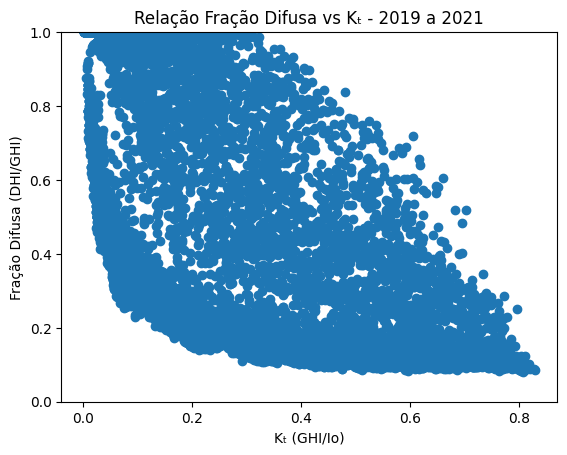

In [50]:
# Kt x Fração Difusa


dni_extra = pvlib.irradiance.get_extra_radiation(nsrdb_data_3Y.index)



Kt = nsrdb_data_3Y['ghi']/dni_extra

diff_fraction = nsrdb_data_3Y['dhi']/nsrdb_data_3Y['ghi']

plt.scatter(Kt, diff_fraction)
plt.ylim(0, 1)
plt.title('Relação Fração Difusa vs Kₜ - 2019 a 2021')
plt.xlabel('Kₜ (GHI/Io)')
plt.ylabel('Fração Difusa (DHI/GHI)')
plt.show()

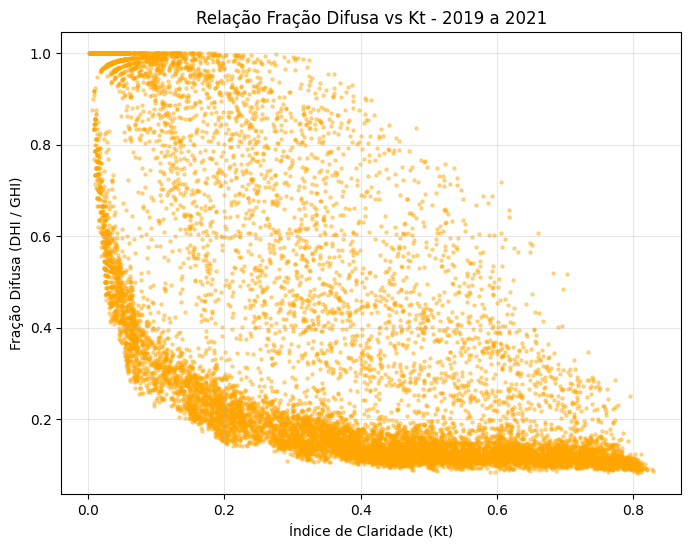

In [51]:
# @title
# @title
plt.figure(figsize=(8,6))
plt.scatter(Kt, diff_fraction, s=5, alpha=0.4, color='orange')
plt.xlabel('Índice de Claridade (Kt)')
plt.ylabel('Fração Difusa (DHI / GHI)')
plt.title('Relação Fração Difusa vs Kt - 2019 a 2021')
plt.grid(True, alpha=0.3)
plt.show()


O gráfico mostra a relação entre dois índices solares importantes:

Índice de Claridade (Kt): razão entre a irradiação global horizontal (GHI) e a irradiação extraterrestre no plano horizontal (H0). Quanto maior o Kt, mais limpa e transparente está a atmosfera.

Fração Difusa: razão entre a irradiação difusa horizontal (DHI) e a irradiação global horizontal (GHI). Indica a proporção de radiação que é difusa.

Geralmente, espera-se uma relação inversa entre Kt e a fração difusa. Em dias muito limpos (Kt alto), a fração difusa é baixa, pois a radiação direta é predominante. Em dias nublados (Kt baixo), a fração difusa é alta, pois a radiação direta é bloqueada pelas nuvens e a radiação difusa domina.

No gráfico, podemos observar:

Regiões de agrupamento:

Para valores altos de Kt (acima de 0.6 a 0.7), a fração difusa tende a ser baixa (abaixo de 0.3). Isso corresponde a dias limpos com predomínio de radiação direta.

Para valores baixos de Kt (abaixo de 0.3 a 0.4), a fração difusa tende a ser alta (acima de 0.6 a 0.7). Isso corresponde a dias nublados com predomínio de radiação difusa.

Comportamento intermediário:

Na faixa de Kt entre 0.4 e 0.6, há uma dispersão maior da fração difusa, indicando condições variáveis de céu (parcialmente nublado).

Possíveis outliers:

Alguns pontos com Kt muito baixo e fração difusa baixa, o que é fisicamente inconsistente (pois se Kt é baixo, espera-se alta fração difusa). Pode ser devido a erros de medição ou condições atmosféricas muito específicas.

Pontos com Kt alto e fração difusa alta também são fisicamente incomuns e podem indicar problemas nos dados.

Densidade de pontos:

A concentração de pontos nas extremidades (alta fração difusa com baixo Kt e baixa fração difusa com alto Kt) confirma a relação inversa esperada.

Qualidade dos dados:

A nuvem de pontos segue aproximadamente a relação teórica, mas a presença de pontos fora do padrão esperado pode indicar a necessidade de verificação da qualidade dos dados.

Em resumo, o gráfico mostra a relação inversa esperada entre o índice de claridade e a fração difusa, com a maioria dos dados seguindo o padrão físico, mas com alguns pontos discrepantes que merecem investigação.

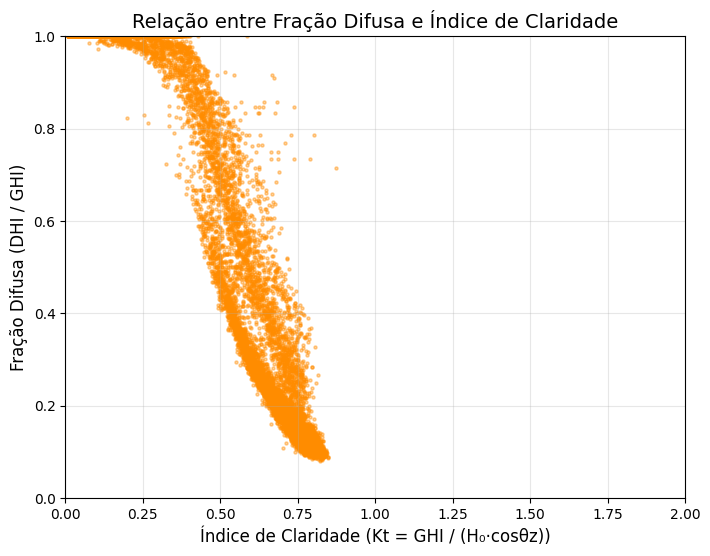

In [52]:
# @title
# @title
# --- Cálculo do índice de claridade Kt (corrigido) ---
# Extraterrestrial irradiance (W/m²)
dni_extra = pvlib.irradiance.get_extra_radiation(nsrdb_data_3Y.index)

# Ângulo zenital solar (°)
solar_position = pvlib.solarposition.get_solarposition(
    nsrdb_data_3Y.index, Latitude, Longitude
)
theta_z = solar_position['zenith']

# Índice de claridade (Kt)
Kt = nsrdb_data_3Y['ghi'] / (dni_extra * np.cos(np.radians(theta_z)))
Kt = Kt.replace([np.inf, -np.inf], np.nan).clip(0, 2)

# Fração difusa
diff_fraction = nsrdb_data_3Y['dhi'] / nsrdb_data_3Y['ghi']
diff_fraction = diff_fraction.replace([np.inf, -np.inf], np.nan).clip(0, 1)

# --- Gráfico ---
plt.figure(figsize=(8,6))
plt.scatter(Kt, diff_fraction, s=5, alpha=0.4, color='darkorange')
plt.xlabel('Índice de Claridade (Kt = GHI / (H₀·cosθz))', fontsize=12)
plt.ylabel('Fração Difusa (DHI / GHI)', fontsize=12)
plt.title('Relação entre Fração Difusa e Índice de Claridade', fontsize=14)
plt.grid(True, alpha=0.3)
plt.ylim(0,1)
plt.xlim(0,2)
plt.show()

### **1.7.2 Inspeção Visual de Duas Dimensões (GHI, DNI e DHI)**
É um gráfico de dispersão ou mapa 2D que representa simultaneamente as componentes do recurso solar, GHI, DNI e DHI

Mostra a consistência ente os componentes e avalia a consistência e qualidade dos dados

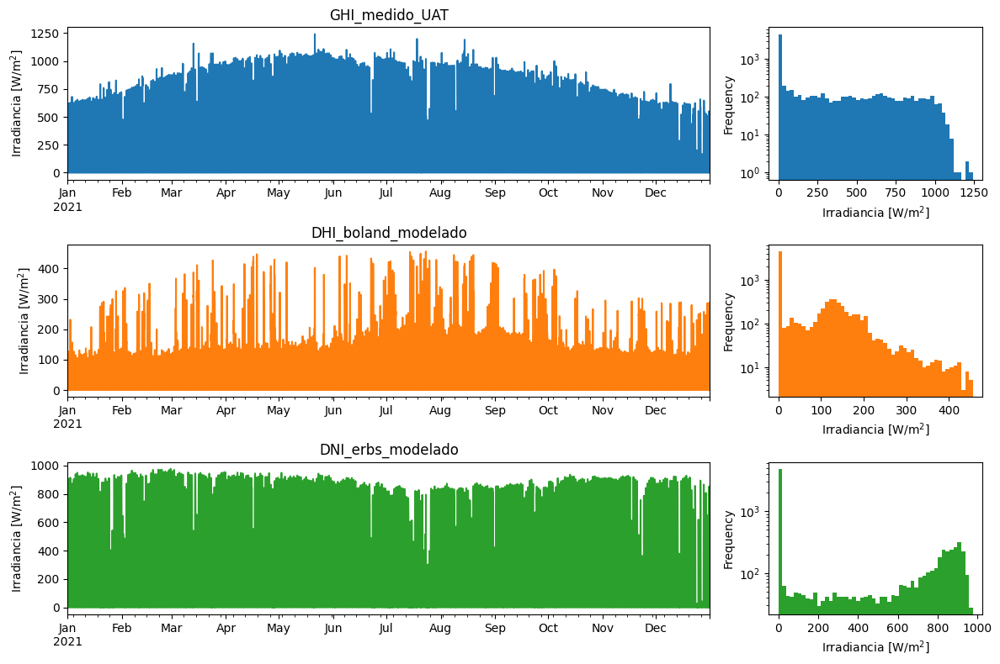

In [53]:
# @title
#Usando o os dados do DHI (Boland) e DNI (Erbs). pd.Dataframe
df_2d_plot = df_consolidado.copy()

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12,8), gridspec_kw={'width_ratios':[3,1]})
for i, c in enumerate(['GHI_medido_UAT', 'DHI_boland_modelado', 'DNI_erbs_modelado']):
    # Use the correct column names from df_consolidado
    df_2d_plot[c].plot(ax=axes[i,0], c='C{}'.format(i), title=c)
    df_2d_plot[c].plot.hist(ax=axes[i,1], logy=True, bins=50, facecolor='C{}'.format(i))
    axes[i,0].set_xlabel('')
    axes[i,0].set_ylabel('Irradiancia [W/m$^2$]')
    axes[i,1].set_xlabel('Irradiancia [W/m$^2$]')
fig.tight_layout()

In [54]:
# @title
days = pd.date_range(df_consolidado.index[0], df_consolidado.index[-1]) # List of days for which to calculate sunrise/sunset

sunrise_sunset = pvlib.solarposition.sun_rise_set_transit_spa(days, latitude=32.22969, longitude=-110.95)

# Convert sunrise/sunset from Datetime to hours (decimal)
sunrise_sunset['sunrise'] = sunrise_sunset['sunrise'].dt.hour + sunrise_sunset['sunrise'].dt.minute/60
sunrise_sunset['sunset'] = sunrise_sunset['sunset'].dt.hour + sunrise_sunset['sunset'].dt.minute/60

* ### Inspeção visual bidimensional
Na visualização dos dados brutos nas seções anteriores, foi possível detectar grandes lacunas, valores extremos e variações sazonais. No entanto, as variações diárias ficaram obscurecidas e praticamente indistinguíveis devido à grande quantidade de dados. Para superar essa limitação, apresentamos nesta seção um método de visualização bidimensional, onde o eixo x corresponde à data, o eixo y corresponde à hora do dia e a cor do pixel corresponde ao valor da medição. A principal vantagem desse método bidimensional é que cada ponto de dados é visível, permitindo a observação de tendências tanto intradiárias quanto sazonais. Isso é particularmente útil para detectar erros ao longo do tempo, como deslocamentos de horário, dados faltantes e possíveis sombreamentos.

Para dar mais estrutura aos gráficos 2D, vamos plotar os horários do nascer e do pôr do sol, que são calculados da seguinte forma:

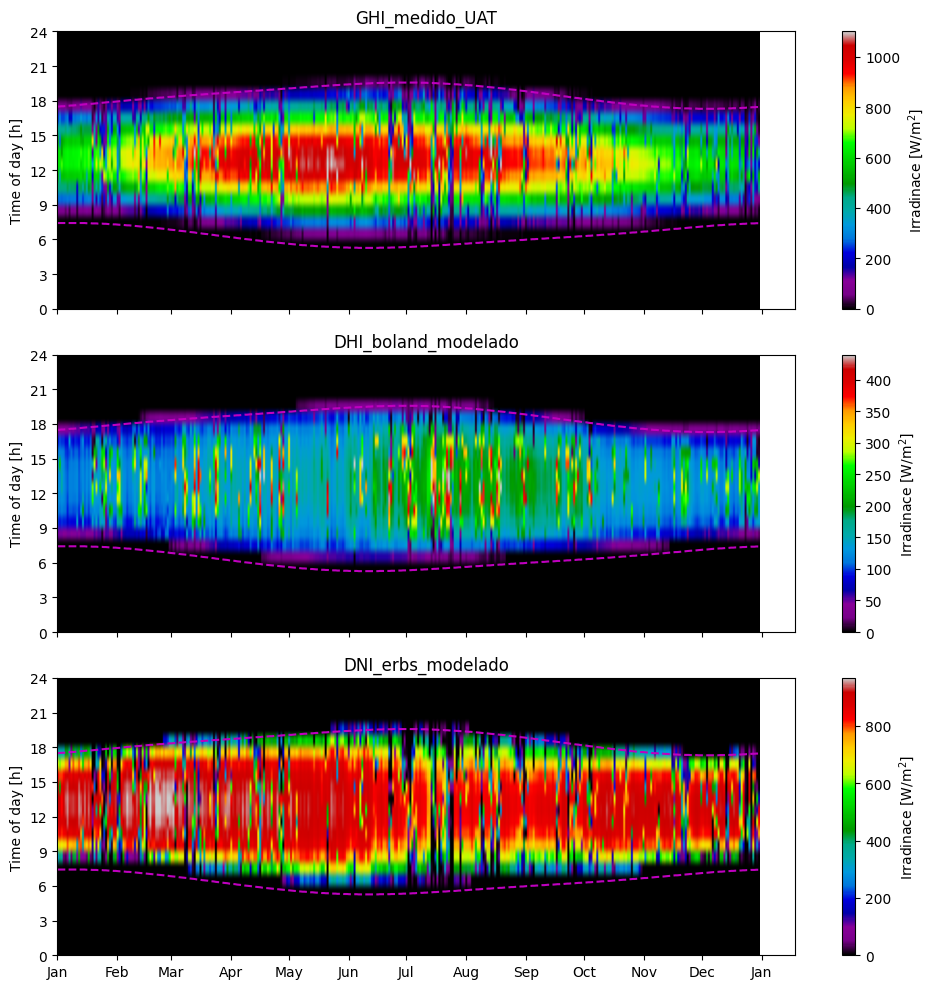

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime as dt
import pvlib
# @title
# Creation of the 2D DataFrame, with time-of-day as rows and days as columns
# Use df_consolidado which contains the desired modeled data and has the correct timezone
# Ensure the index is a DatetimeIndex with timezone information
df_consolidado.index = pd.to_datetime(df_consolidado.index)
if df_consolidado.index.tz is None:
    df_consolidado.index = df_consolidado.index.tz_localize(tz) # Assuming 'tz' is defined earlier

df_2d = df_consolidado.set_index([df_consolidado.index.date, df_consolidado.index.hour + df_consolidado.index.minute/60]).unstack(level=0)

# Calculate the extents of the 2D plot, in the format [x_start, x_end, y_start, y_end]
xlims = mdates.date2num([df_consolidado.index[0].date(), df_consolidado.index[-1].date()])
extent = [xlims[0], xlims[1], 0, 24]

xticks = pd.date_range('2021-01-01', periods=13, freq='MS')

# Generate subplots and plot 2D DataFrame and sunrise/sunset line
fig, axes = plt.subplots(nrows=3, figsize=(10,10), sharex=True)
# Use the correct column names from df_consolidado
for i, c in enumerate(['GHI_medido_UAT','DHI_boland_modelado','DNI_erbs_modelado']):
    im = axes[i].imshow(df_2d[c], aspect='auto', origin='lower', cmap='nipy_spectral',
                        extent=extent, vmax=df_consolidado[c].quantile(0.999))
    axes[i].set_title(c)
    axes[i].xaxis_date()
    axes[i].set_yticks(np.arange(0,25,3))
    axes[i].set_ylabel('Time of day [h]')
    # Assuming sunrise_sunset is calculated for the correct time period and timezone
    # Make sure sunrise_sunset index is also a DatetimeIndex with timezone info
    sunrise_sunset.index = pd.to_datetime(sunrise_sunset.index)
    if sunrise_sunset.index.tz is None:
         sunrise_sunset.index = sunrise_sunset.index.tz_localize(tz) # Assuming 'tz' is defined earlier

    axes[i].plot(mdates.date2num(sunrise_sunset.index), sunrise_sunset[['sunrise', 'sunset']], 'm--')
    cbar = fig.colorbar(im, ax=axes[i], orientation='vertical', label='Irradinace [W/m$^2$]')

axes[-1].set_xticks(mdates.date2num(xticks))
axes[-1].set_xticklabels(xticks.strftime('%b'))

fig.tight_layout()

### **1.7.3 Componentes do Recurso Solar na Horizontal vs Ângulo zenital**
Informa como a irradiância global na horizontal (GHI) varia com o ângulo zenital do Sol, ou seja, com a altura solar no céu. A irradiância é máxima quando o Sol está próximo do zênite (meio-dia) e diminui à medida que o Sol se aproxima do horizonte (ângulo zenital aumenta).

Tem a finalidade de visualizar o perfil diário do recurso solar, avaliar perdas geométricas em superfícies horizontais e determinar horários mais produtivos para sistemas FV.

In [56]:
# @title
# @title
#adicionando a coluna do zenith
solpos['zenith']

,zenith
2021-01-01 00:00:00-07:00,168.94
2021-01-01 01:00:00-07:00,168.27
2021-01-01 02:00:00-07:00,157.56
2021-01-01 03:00:00-07:00,145.16
2021-01-01 04:00:00-07:00,132.48
...,...
2021-12-31 19:00:00-07:00,108.65
2021-12-31 20:00:00-07:00,121.02
2021-12-31 21:00:00-07:00,133.63
2021-12-31 22:00:00-07:00,146.29


In [57]:
# @title
# @title
df['extra_radiation'] = pvlib.irradiance.get_extra_radiation(df.index)
df['mu0'] = np.cos(np.deg2rad(solpos['zenith'])).clip(lower=0)

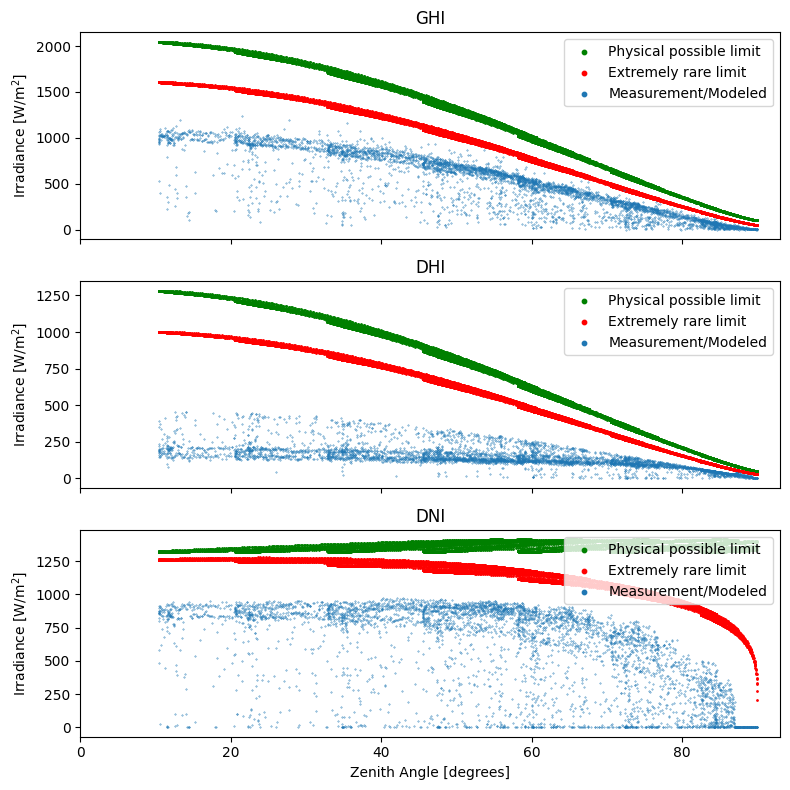

In [58]:
df_limits = pd.DataFrame(index=df_consolidado.index)

# Calculate solar position using the consolidated dataframe index
solpos = pvlib.solarposition.get_solarposition(time=df_consolidado.index,
                                                latitude=latitude,
                                                longitude=longitude)

df_limits['zenith'] = solpos['zenith']

# Recalculate extraterrestrial radiation and airmass for the consolidated index
dni_extra = pvlib.irradiance.get_extra_radiation(df_consolidado.index)
airmass = pvlib.atmosphere.get_relative_airmass(solpos['apparent_zenith'])


# Physical possible limits - Use the recalculations based on the consolidated index
df_limits['ppl_upper_ghi'] = 1.5 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 100
df_limits['ppl_upper_dhi'] = 0.95 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 50
df_limits['ppl_upper_dni'] = 1 * dni_extra

# Extremely rare limits - Use the recalculations based on the consolidated index
df_limits['erl_upper_ghi'] = 1.2 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 50
df_limits['erl_upper_dhi'] = 0.75 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**1.2 if x <= 90 else 0) + 30
df_limits['erl_upper_dni'] = 0.95 * dni_extra * df_limits['zenith'].apply(lambda x: np.cos(np.deg2rad(x))**0.2 if x <= 90 else 0) + 10


# Plot measured data and limits
fig, axes = plt.subplots(nrows=3, figsize=(8,8), sharex=True)
# Use the correct columns from df_consolidado for plotting the measurements
plot_data = {
    'ghi': df_consolidado['GHI_medido_UAT'],
    'dhi': df_consolidado['DHI_boland_modelado'],
    'dni': df_consolidado['DNI_erbs_modelado']
}

for i, c in enumerate(['ghi','dhi','dni']):
    df_limits[df_limits['zenith']<90].plot.scatter(ax=axes[i], x='zenith', y='ppl_upper_{}'.format(c), s=1, c='g', label='Physical possible limit')
    df_limits[df_limits['zenith']<90].plot.scatter(ax=axes[i], x='zenith', y='erl_upper_{}'.format(c), s=1, c='r', label='Extremely rare limit')
    # Plot the corresponding modeled/measured data from plot_data
    axes[i].scatter(solpos['zenith'][df_limits['zenith']<90], plot_data[c][df_limits['zenith']<90], s=0.1, alpha=1, label='Measurement/Modeled')
    axes[i].set_title(c.upper()) # Use uppercase for title
    axes[i].set_xlim([0, 93]) # Set x-axis limit
    axes[i].set_xlabel('Zenith Angle [degrees]')
    axes[i].set_ylabel('Irradiance [W/m$^2$]')

    # Configure legend
    legend = axes[i].legend(loc='upper right')
    for handle in legend.legend_handles:
        handle.set_sizes([10])
        handle.set_alpha(1)

fig.tight_layout()
plt.show()



---





---



---



---

